# Análisis de datos georreferenciados

In [ ]:
pip install osmnx rioxarray datashader contextily xarray pysal pygeos

## Una pequeña muestra

In [ ]:
import pandas as pd
import geopandas as gpd
import rioxarray
import xarray
import numpy as np
from numpy.random import seed

import osmnx

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.patches import Ellipse
import seaborn as sns
import datashader
import contextily

from shapely.geometry import Polygon
from shapely import geometry

import pysal
from pysal.lib import cg as geometry
from pysal.lib import weights
from pysal.viz import splot
from pysal.explore import esda
from pysal.lib import weights

import mapclassify

from splot.esda import plot_moran
from splot import esda as esdaplot

from sklearn.cluster import DBSCAN

from pointpats import centrography
import libpysal
from pygeos import minimum_rotated_rectangle, from_shapely, to_shapely
from pointpats import (
    distance_statistics,
    QStatistic,
    random,
    PointPattern,
)


In [ ]:
gt_polygons = gpd.read_file('/content/countries_clean.gpkg')

In [ ]:
gt_polygons.head()

,ADMIN,geometry
0,Indonesia,"MULTIPOLYGON (((13102705.696 463877.598, 13102..."
1,Malaysia,"MULTIPOLYGON (((13102705.696 463877.598, 13101..."
2,Chile,"MULTIPOLYGON (((-7737827.685 -1979875.500, -77..."
3,Bolivia,"POLYGON ((-7737827.685 -1979875.500, -7737828...."
4,Peru,"MULTIPOLYGON (((-7737827.685 -1979875.500, -77..."


In [ ]:
type(gt_polygons.geometry[0])

shapely.geometry.multipolygon.MultiPolygon

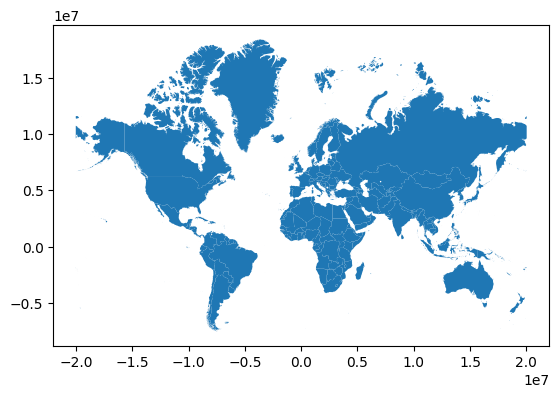

In [ ]:
gt_polygons.plot();

In [ ]:
gt_polygons["centroid"] = gt_polygons.geometry.centroid # identificar centroides

In [ ]:
gt_polygons.head()

,ADMIN,geometry,centroid
0,Indonesia,"MULTIPOLYGON (((13102705.696 463877.598, 13102...",POINT (13055431.810 -248921.141)
1,Malaysia,"MULTIPOLYGON (((13102705.696 463877.598, 13101...",POINT (12211696.493 422897.505)
2,Chile,"MULTIPOLYGON (((-7737827.685 -1979875.500, -77...",POINT (-7959811.948 -4915458.802)
3,Bolivia,"POLYGON ((-7737827.685 -1979875.500, -7737828....",POINT (-7200010.945 -1894653.148)
4,Peru,"MULTIPOLYGON (((-7737827.685 -1979875.500, -77...",POINT (-8277554.831 -1032942.536)


<Axes: >

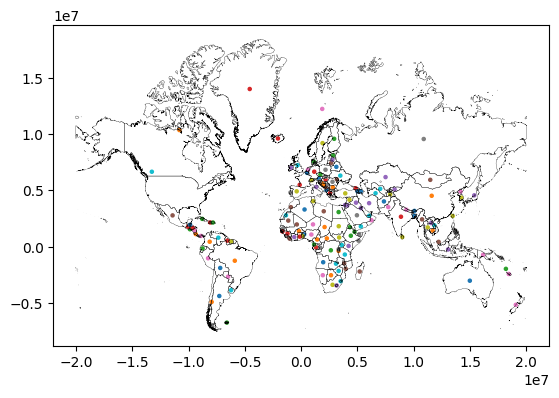

In [ ]:
# graficar centroides
ax = gt_polygons.set_geometry("centroid").plot("ADMIN", markersize=5)
# graficar polígonos sin color
gt_polygons.plot(
    "ADMIN", ax=ax, facecolor="none", edgecolor="k", linewidth=0.2
)

In [ ]:
gt_polygons.query('ADMIN == "Colombia"')

,ADMIN,geometry,centroid
121,Colombia,"MULTIPOLYGON (((-8775168.968 159683.588, -8773...",POINT (-8135890.129 437872.265)


<Axes: >

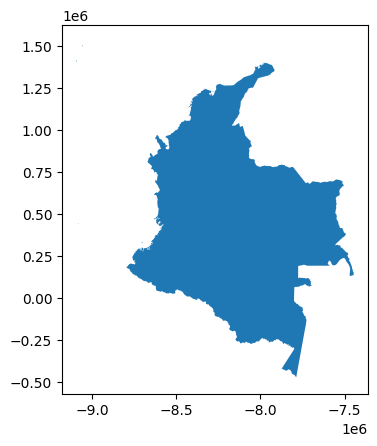

In [ ]:
gt_polygons.query('ADMIN == "Colombia"').plot()

In [ ]:
gt_polygons.query('ADMIN == "Argentina"')

,ADMIN,geometry,centroid
5,Argentina,"MULTIPOLYGON (((-7490104.170 -2733209.981, -74...",POINT (-7282475.324 -4386634.470)


<Axes: >

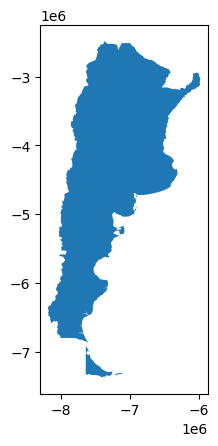

In [ ]:
gt_polygons.query('ADMIN == "Argentina"').plot()

Las tablas pueden almacenar polígonos, puntos y líneas.

## Puntos

In [ ]:
gt_points = pd.read_csv("https://raw.githubusercontent.com/gdsbook/book/master/data/tokyo/tokyo_clean.csv")

In [ ]:
type(gt_points)

pandas.core.frame.DataFrame

In [ ]:
gt_points.head()

,user_id,longitude,latitude,date_taken,photo/video_page_url,x,y
0,10727420@N00,139.700499,35.674000,2010-04-09 17:26:25.0,http://www.flickr.com/photos/10727420@N00/4545...,1.555139e+07,4.255856e+06
1,8819274@N04,139.766521,35.709095,2007-02-10 16:08:40.0,http://www.flickr.com/photos/8819274@N04/26503...,1.555874e+07,4.260667e+06
2,62068690@N00,139.765632,35.694482,2008-12-21 15:45:31.0,http://www.flickr.com/photos/62068690@N00/3125...,1.555864e+07,4.258664e+06
3,49503094041@N01,139.784391,35.548589,2011-11-11 05:48:54.0,http://www.flickr.com/photos/49503094041@N01/6...,1.556073e+07,4.238684e+06
4,40443199@N00,139.768753,35.671521,2006-04-06 16:42:49.0,http://www.flickr.com/photos/40443199@N00/2482...,1.555899e+07,4.255517e+06


In [ ]:
pt_geoms = gpd.points_from_xy(
    x=gt_points["longitude"],
    y=gt_points["latitude"],

    crs="EPSG:4326",
) # construir una geometría a partir de la longitud y la latitud

In [ ]:
gt_points = gpd.GeoDataFrame(gt_points, geometry=pt_geoms) # creación del geo dataframe

In [ ]:
gt_points.head()

,user_id,longitude,latitude,date_taken,photo/video_page_url,x,y,geometry
0,10727420@N00,139.700499,35.674000,2010-04-09 17:26:25.0,http://www.flickr.com/photos/10727420@N00/4545...,1.555139e+07,4.255856e+06,POINT (139.70050 35.67400)
1,8819274@N04,139.766521,35.709095,2007-02-10 16:08:40.0,http://www.flickr.com/photos/8819274@N04/26503...,1.555874e+07,4.260667e+06,POINT (139.76652 35.70909)
2,62068690@N00,139.765632,35.694482,2008-12-21 15:45:31.0,http://www.flickr.com/photos/62068690@N00/3125...,1.555864e+07,4.258664e+06,POINT (139.76563 35.69448)
3,49503094041@N01,139.784391,35.548589,2011-11-11 05:48:54.0,http://www.flickr.com/photos/49503094041@N01/6...,1.556073e+07,4.238684e+06,POINT (139.78439 35.54859)
4,40443199@N00,139.768753,35.671521,2006-04-06 16:42:49.0,http://www.flickr.com/photos/40443199@N00/2482...,1.555899e+07,4.255517e+06,POINT (139.76875 35.67152)


## Superficies

In [ ]:
pop = rioxarray.open_rasterio("/content/ghsl_sao_paulo.tif") #geotiff es un formato de imagen

In [ ]:
type(pop)

xarray.core.dataarray.DataArray

In [ ]:
pop.coords

Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -4.482e+06 -4.482e+06 ... -4.365e+06 -4.365e+06
  * y            (y) float64 -2.822e+06 -2.822e+06 ... -2.926e+06 -2.926e+06
    spatial_ref  int64 0

In [ ]:
pop.attrs

{'AREA_OR_POINT': 'Area',
 '_FillValue': -200.0,
 'scale_factor': 1.0,
 'add_offset': 0.0}

In [ ]:
pop.shape

(1, 416, 468)

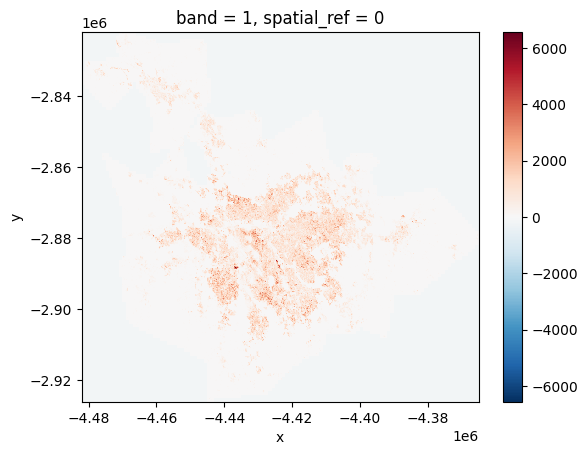

In [ ]:
pop.sel(band=1).plot()

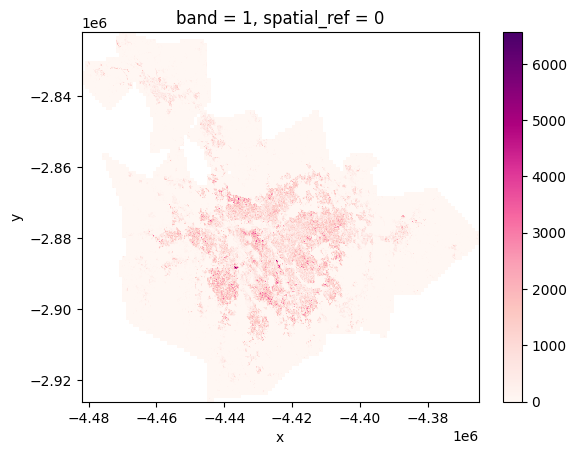

In [ ]:
pop.where(pop != -200).sel(band=1).plot(cmap="RdPu")

## Gráficos espaciales

In [ ]:
graph = osmnx.graph_from_place("Yoyogi Park, Shibuya, Tokyo, Japan")
#osmnx es una librería que permite extraer información espacial de Open Street Map

In [ ]:
type(graph)

networkx.classes.multidigraph.MultiDiGraph

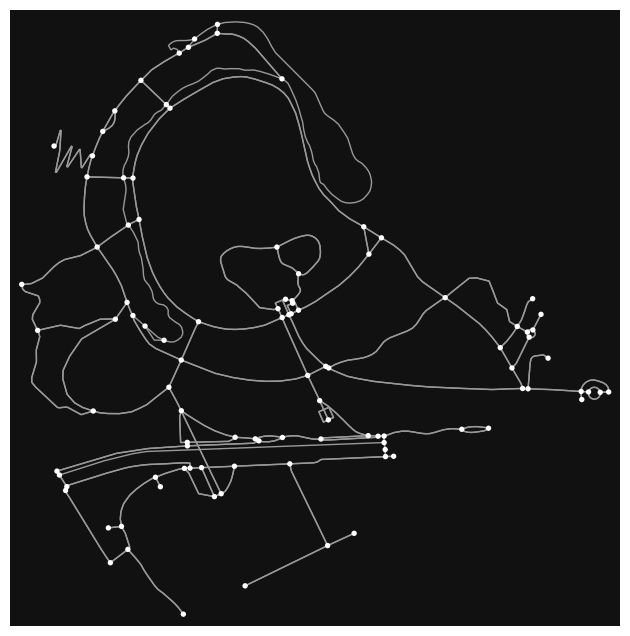

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
osmnx.plot_graph(graph)

In [ ]:
graph2 = osmnx.graph_from_place("Simon Bolivar Park, Bogotá, Colombia")

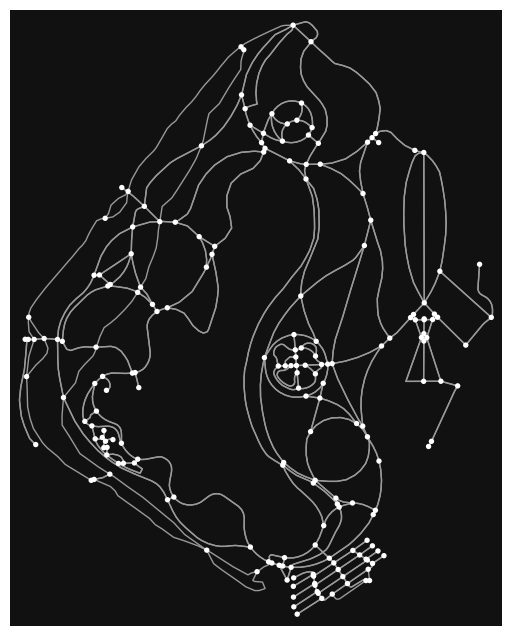

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
osmnx.plot_graph(graph2)

In [ ]:
len(graph2.nodes)

195

In [ ]:
len(graph2.edges)

557

In [ ]:
graph2.nodes

NodeView((262419606, 262419619, 262419625, 262419633, 262419637, 262419641, 262419646, 262419668, 262419669, 262419682, 262419707, 262419710, 262419716, 262419725, 262419746, 262419760, 262419762, 262419763, 262419782, 262419787, 262419795, 262419811, 262419813, 262419820, 262419822, 262419824, 720557637, 721329851, 721428192, 721851474, 721851475, 721851477, 721851479, 721851480, 721851481, 721851482, 721851487, 721851488, 769445707, 769445722, 769445723, 769445729, 769446224, 769446227, 769446231, 769446232, 769446238, 769446243, 769446265, 769446291, 769446301, 769446309, 769446317, 769446322, 1052308705, 1052308707, 1707090360, 1707090399, 1707090419, 1707090435, 2338755647, 2338755651, 2338755652, 2338760589, 2338760592, 2338760603, 2338760606, 2338760614, 2341228646, 3309679010, 3309679015, 3309679016, 3661789755, 4689566605, 4689566608, 4689572721, 4689572723, 4689572731, 4689574107, 4689601455, 4689601471, 5755009515, 5764943876, 6532256105, 6532256106, 6558286639, 6707714317, 

In [ ]:
graph2.nodes[262419606]

{'y': 4.662201, 'x': -74.0940099, 'street_count': 3}

In [ ]:
graph2.edges

In [ ]:
graph2.edges[(262419606, 769446317, 0)]

{'osmid': 90674530,
 'highway': 'footway',
 'width': '3',
 'oneway': False,
 'reversed': False,
 'length': 8.929}

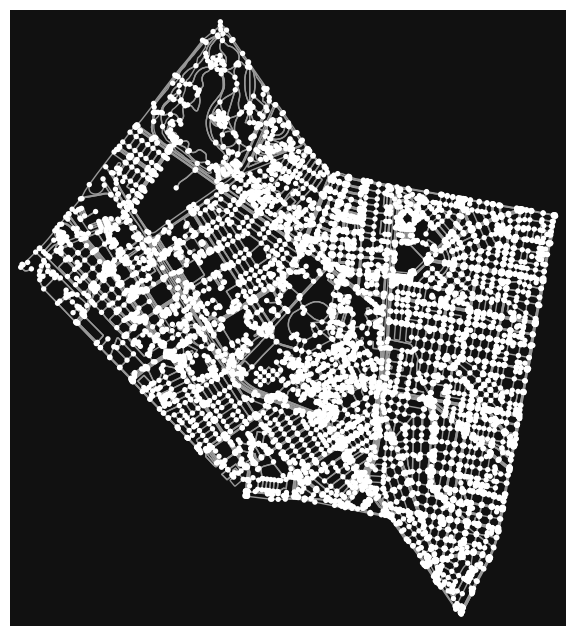

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
osmnx.plot_graph(osmnx.graph_from_place("Teusaquillo, Bogotá, Colombia"))

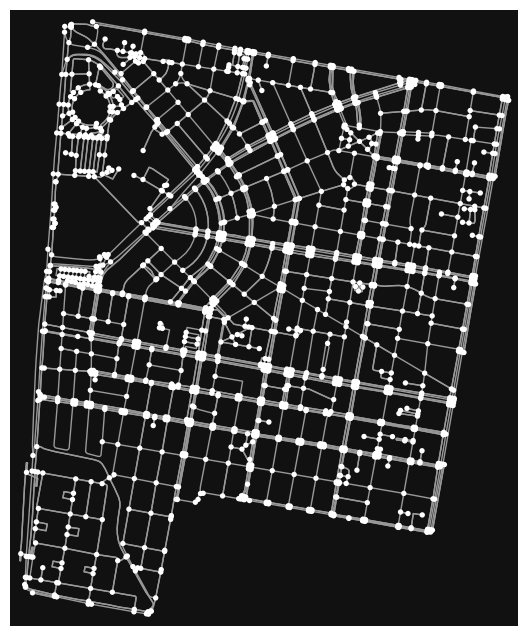

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
osmnx.plot_graph(osmnx.graph_from_place("Galerias, Teusaquillo, Bogotá, Colombia"))

In [ ]:
G = osmnx.graph_from_place('Bogotá, Colombia')
osmnx.plot_graph(G)

In [ ]:
help(osmnx.graph_from_place)

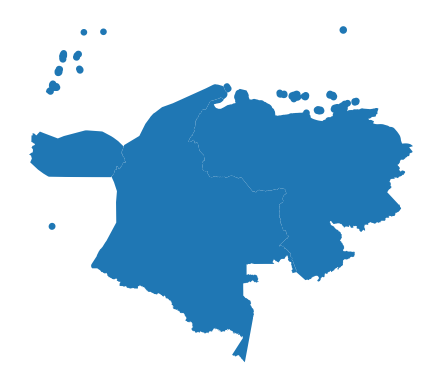

In [ ]:
places = osmnx.geocode_to_gdf(['Colombia', 'Panamá', 'Venezuela'])
places = osmnx.project_gdf(places)
ax = places.plot()
_ = ax.axis('off')

## Weights

Los pesos espaciales son una forma de representar gráficos en estadística espacial. Son construidos para representar relaciones entre las unidades observadas en un dataset georreferenciado. Los pesos conectan objetos de una tabla geográfica a otra a través de relaciones espaciales.

En este contexto, la proximidad y la adyacencia se hacen importantes.

### Pesos contiguos

Un par de contiguo de objetos espaciales son aquellos que comparten el mismo límite.

In [ ]:
# generar puntos en una grilla
l = np.arange(3)
xs, ys = np.meshgrid(l, l)

polys = []
# generar polígonos a partir de los datos
for x, y in zip(xs.flatten(), ys.flatten()):
    poly = Polygon([(x, y), (x + 1, y), (x + 1, y + 1), (x, y + 1)])
    polys.append(poly)
# transformarla en una GeoSeries
polys = gpd.GeoSeries(polys)
gdf = gpd.GeoDataFrame(
    {
        "geometry": polys,
        "id": ["P-%s" % str(i).zfill(2) for i in range(len(polys))],
    }
)

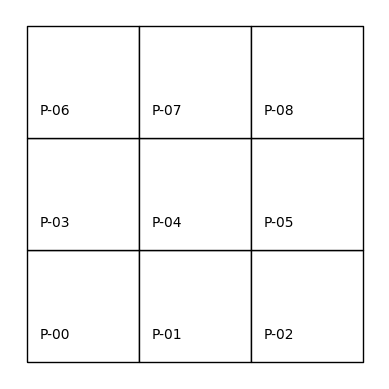

In [ ]:
# graficar la tabla
ax = gdf.plot(facecolor="w", edgecolor="k")

for x, y, t in zip(
    [p.centroid.x - 0.25 for p in polys],
    [p.centroid.y - 0.25 for p in polys],
    [i for i in gdf["id"]],
):
    plt.text(
        x,
        y,
        t,
        verticalalignment="center",
        horizontalalignment="center",
    )

ax.set_axis_off()
plt.show()

#### Chess

Una forma sencilla de expresar contigüidad/adyacencia puede provenir de la forma en que las piezas de ajedrez se pueden mover. La contigüidad *Rook* (torre) require que el par de polígonos en cuestión compartan un límite. Observe que el polígono 0 sería vecino del polígono 1 y del polígono 3, pero no del 4.

In [ ]:
# construir una matriz de adyacencia Rook 3x3
wr = weights.contiguity.Rook.from_dataframe(gdf)

/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centr

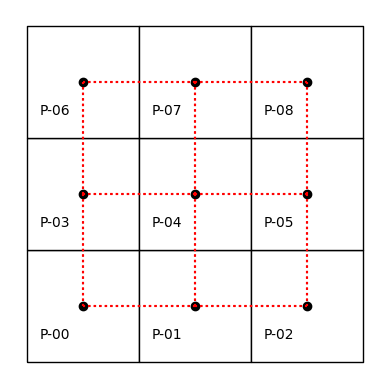

In [ ]:
f, ax = plt.subplots(1, 1, subplot_kw=dict(aspect="equal"))

gdf.plot(facecolor="w", edgecolor="k", ax=ax)

for x, y, t in zip(
    [p.centroid.x - 0.25 for p in polys],
    [p.centroid.y - 0.25 for p in polys],
    [i for i in gdf["id"]],
):
    plt.text(
        x,
        y,
        t,
        verticalalignment="center",
        horizontalalignment="center",
    )
# conectividad de los pesos
wr.plot(gdf, edge_kws=dict(color="r", linestyle=":"), ax=ax)

ax.set_axis_off()

In [ ]:
wr.neighbors

{0: [1, 3],
 1: [0, 2, 4],
 2: [1, 5],
 3: [0, 4, 6],
 4: [1, 3, 5, 7],
 5: [8, 2, 4],
 6: [3, 7],
 7: [8, 4, 6],
 8: [5, 7]}

In [ ]:
pd.DataFrame(*wr.full()).astype(int)

,0,1,2,3,4,5,6,7,8
0,0,1,0,1,0,0,0,0,0
1,1,0,1,0,1,0,0,0,0
2,0,1,0,0,0,1,0,0,0
3,1,0,0,0,1,0,1,0,0
4,0,1,0,1,0,1,0,1,0
5,0,0,1,0,1,0,0,0,1
6,0,0,0,1,0,0,0,1,0
7,0,0,0,0,1,0,1,0,1
8,0,0,0,0,0,1,0,1,0


In [ ]:
wr.nonzero

24

In [ ]:
# Esto es similar, solo que ahora se tienen en cuenta los movimientos de la reina
wq = weights.contiguity.Queen.from_dataframe(gdf)
wq.neighbors

{0: [1, 3, 4],
 1: [0, 2, 3, 4, 5],
 2: [1, 4, 5],
 3: [0, 1, 4, 6, 7],
 4: [0, 1, 2, 3, 5, 6, 7, 8],
 5: [1, 2, 4, 7, 8],
 6: [3, 4, 7],
 7: [3, 4, 5, 6, 8],
 8: [4, 5, 7]}

/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centr

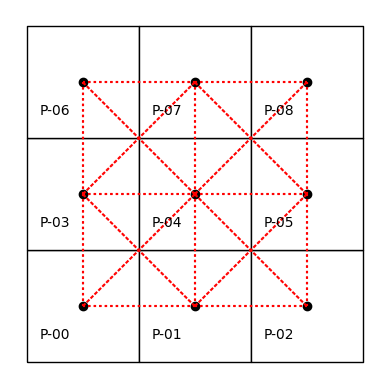

In [ ]:

f, ax = plt.subplots(1, 1, subplot_kw=dict(aspect="equal"))

gdf.plot(facecolor="w", edgecolor="k", ax=ax)

for x, y, t in zip(
    [p.centroid.x - 0.25 for p in polys],
    [p.centroid.y - 0.25 for p in polys],
    [i for i in gdf["id"]],
):
    plt.text(
        x,
        y,
        t,
        verticalalignment="center",
        horizontalalignment="center",
    )

wq.plot(gdf, edge_kws=dict(color="r", linestyle=":"), ax=ax)

ax.set_axis_off()

In [ ]:
wq.weights

{0: [1.0, 1.0, 1.0],
 1: [1.0, 1.0, 1.0, 1.0, 1.0],
 2: [1.0, 1.0, 1.0],
 3: [1.0, 1.0, 1.0, 1.0, 1.0],
 4: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 5: [1.0, 1.0, 1.0, 1.0, 1.0],
 6: [1.0, 1.0, 1.0],
 7: [1.0, 1.0, 1.0, 1.0, 1.0],
 8: [1.0, 1.0, 1.0]}

In [ ]:
wq.cardinalities

{0: 3, 1: 5, 2: 3, 3: 5, 4: 8, 5: 5, 6: 3, 7: 5, 8: 3}

In [ ]:
wq.histogram

[(3, 4), (4, 0), (5, 4), (6, 0), (7, 0), (8, 1)]

<Axes: ylabel='Frequency'>

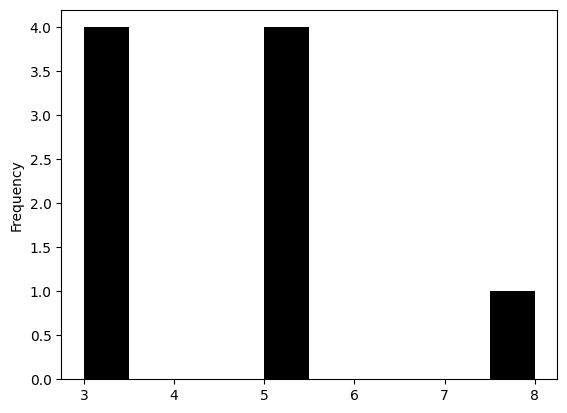

In [ ]:
pd.Series(wq.cardinalities).plot.hist(color="k")

In [ ]:
wq.s0

40.0

In [ ]:
wq.pct_nonzero

49.382716049382715

In [ ]:
pd.DataFrame(*wq.full()).astype(int)

,0,1,2,3,4,5,6,7,8
0,0,1,0,1,1,0,0,0,0
1,1,0,1,1,1,1,0,0,0
2,0,1,0,0,1,1,0,0,0
3,1,1,0,0,1,0,1,1,0
4,1,1,1,1,0,1,1,1,1
5,0,1,1,0,1,0,0,1,1
6,0,0,0,1,1,0,0,1,0
7,0,0,0,1,1,1,1,0,1
8,0,0,0,0,1,1,0,1,0


In [ ]:
san_diego_tracts = gpd.read_file(
    "/content/sandiego_tracts.gpkg"
)
w_queen = weights.contiguity.Queen.from_dataframe(san_diego_tracts)

/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centroid.apply(lambda p: (p.x, p.y))
/usr/local/lib/python3.10/dist-packages/libpysal/weights/weights.py:1296: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  centroids = gdf.loc[neighbors].centr

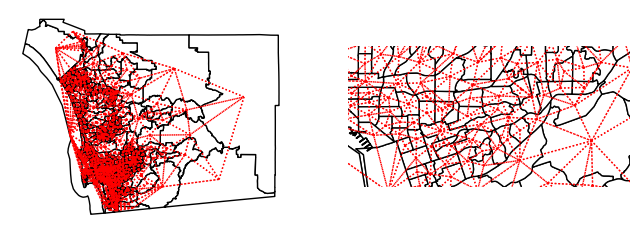

In [ ]:
f, axs = plt.subplots(1, 2, figsize=(8, 4))
for i in range(2):
    ax = san_diego_tracts.plot(
        edgecolor="k", facecolor="w", ax=axs[i]
    )

    w_queen.plot(
        san_diego_tracts,
        ax=axs[i],
        edge_kws=dict(color="r", linestyle=":", linewidth=1),
        node_kws=dict(marker=""),
    )

    axs[i].set_axis_off()
axs[1].axis([-13040000, -13020000, 3850000, 3860000]);

In [ ]:
print(w_queen.n)
print(w_queen.pct_nonzero)

628
1.018296888311899


<Axes: ylabel='Frequency'>

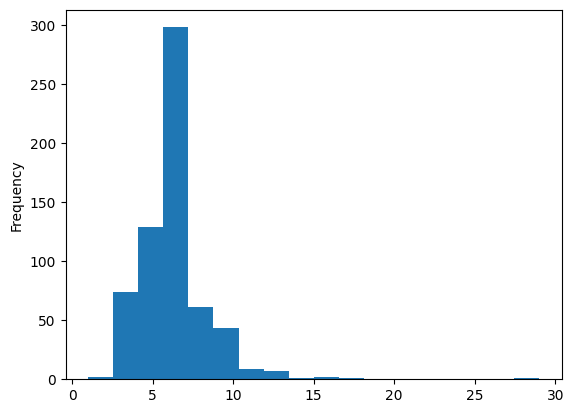

In [ ]:
s = pd.Series(w_queen.cardinalities)
s.plot.hist(bins=s.unique().shape[0])

0.8722463385938578


<Axes: ylabel='Frequency'>

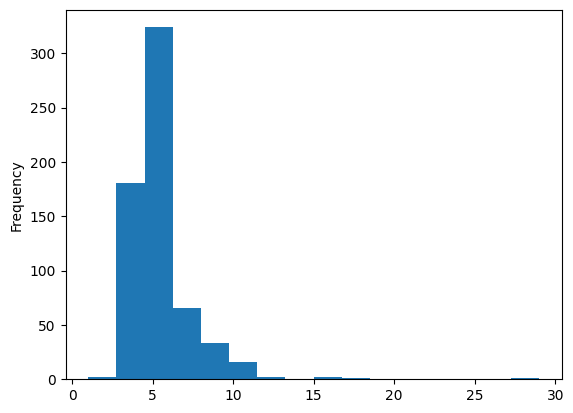

In [ ]:
w_rook = weights.contiguity.Rook.from_dataframe(san_diego_tracts)
print(w_rook.pct_nonzero)
s = pd.Series(w_rook.cardinalities)
s.plot.hist(bins=s.unique().shape[0])

In [ ]:
w_sao_paulo = weights.contiguity.Queen.from_xarray(pop)

In [ ]:
w_sao_paulo

#### KNN

El método KNN ubica a los K vecinos más cercanos, tomando el centroide de cada polígono y calculando la distancia a los demás puntos.

In [ ]:
wk4 = weights.distance.KNN.from_dataframe(san_diego_tracts, k=4)

In [ ]:
wk4.islands

[]

In [ ]:
wk4.histogram

[(4, 628)]

#### Kernel

KNN asigna 1 a los polígonos cercanos y 0 a aquellos que no. Sin embargo, también se pueden obtener valores continuos. El valor de los pesos será una función de dos elementos: función de kernel y el intervalo. La primera controla cómo la distancia entre *i* y *j* es modulada. La segunda especifica la distancia entre cada par de unidades sobre la cual se aplica la función de kernel. Para aquellas observaciones separadas por distancias mayores que el intervalor, los pesos son cero.

In [ ]:
w_kernel = weights.distance.Kernel.from_dataframe(gdf)

In [ ]:
w_kernel.function

'triangular'

In [ ]:
w_kernel.bandwidth[0:5]

array([[1.0000001],
       [1.0000001],
       [1.0000001],
       [1.0000001],
       [1.0000001]])

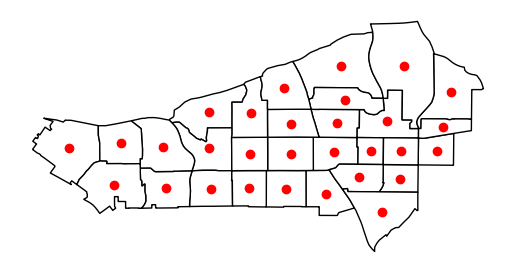

In [ ]:
sub_30 = san_diego_tracts.query("sub_30 == True")

ax = sub_30.plot(facecolor="w", edgecolor="k")

sub_30.head(30).centroid.plot(color="r", ax=ax)

ax.set_axis_off()

In [ ]:
w_adaptive = weights.distance.Kernel.from_dataframe(
    sub_30, fixed=False, k=15
)
w_adaptive.bandwidth[:5]

array([[7065.74020822],
       [3577.22591841],
       [2989.74807871],
       [2891.46196945],
       [3965.08354232]])

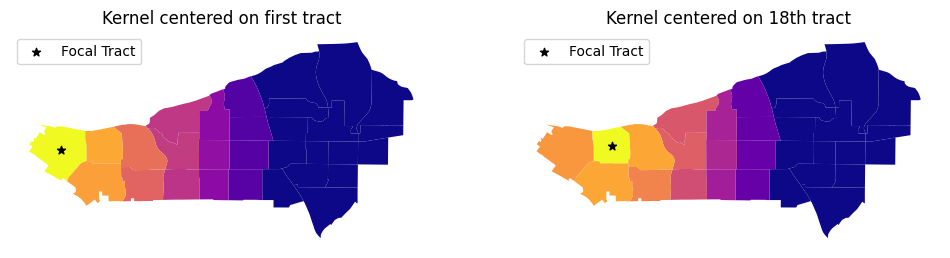

In [ ]:
full_matrix, ids = w_adaptive.full()

f, ax = plt.subplots(
    1, 2, figsize=(12, 6), subplot_kw=dict(aspect="equal")
)
# agregar pesos para el primer polígono y graficar en el primer subplot
sub_30.assign(weight_0=full_matrix[0]).plot(
    "weight_0", cmap="plasma", ax=ax[0]
)

sub_30.assign(weight_18=full_matrix[17]).plot(
    "weight_18", cmap="plasma", ax=ax[1]
)

sub_30.iloc[[0], :].centroid.plot(
    ax=ax[0], marker="*", color="k", label="Focal Tract"
)
sub_30.iloc[[17], :].centroid.plot(
    ax=ax[1], marker="*", color="k", label="Focal Tract"
)

ax[0].set_title("Kernel centered on first tract")
ax[1].set_title("Kernel centered on 18th tract")

[ax_.set_axis_off() for ax_ in ax]

[ax_.legend(loc="upper left") for ax_ in ax]

In [ ]:
w_kernel.pct_nonzero

40.74074074074074

#### Banda de distancia

Otra forma de calcular los pesos es dibujar un círculo alrededor de una observación y considerar vecinos a todas aquellas que estén dentro del círculo.

In [ ]:
w_bdb = weights.distance.DistanceBand.from_dataframe(
    gdf, 1.5, binary=True
)

In [ ]:
w_hy = weights.distance.DistanceBand.from_dataframe(
    gdf, 1.5, binary=False
)

In [ ]:
wq.weights[4]

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

In [ ]:
w_hy.weights[4]

[0.7071067811865475,
 1.0,
 0.7071067811865475,
 1.0,
 1.0,
 0.7071067811865475,
 1.0,
 0.7071067811865475]

## Choropleth mapping

Mapas que muestran información estadística codificada por una paleta de colores.

### Clasificación de datos cuantitativos

El problema de clasificación es definir límites de grupos tal que

$$c_j<y_i \leq c_{j+1} ∀ y_i\in C_j$$

In [ ]:
mx = gpd.read_file("/content/mexico/mexicojoin.shp")
mx[["NAME", "PCGDP1940"]].head()

,NAME,PCGDP1940
0,Baja California Norte,22361.0
1,Baja California Sur,9573.0
2,Nayarit,4836.0
3,Jalisco,5309.0
4,Aguascalientes,10384.0


<Axes: xlabel='PCGDP1940', ylabel='Count'>

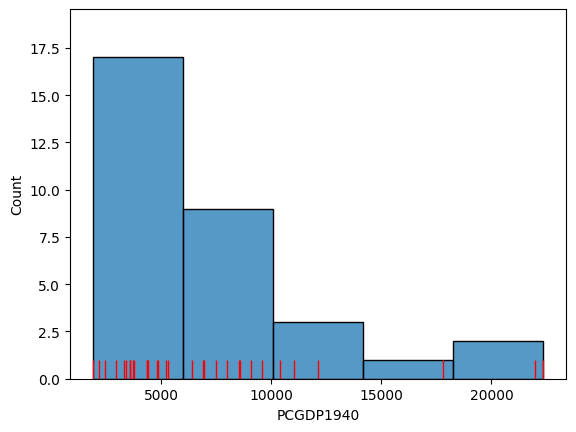

In [ ]:
ax = sns.histplot(mx["PCGDP1940"], bins=5)

sns.rugplot(mx["PCGDP1940"], height=0.05, color="red", ax=ax)

In [ ]:
mx["PCGDP1940"].describe()

count       32.000000
mean      7230.531250
std       5204.952883
min       1892.000000
25%       3701.750000
50%       5256.000000
75%       8701.750000
max      22361.000000
Name: PCGDP1940, dtype: float64

In [ ]:
counts, bins, patches = ax.hist(mx["PCGDP1940"], bins=5)

In [ ]:
counts

array([17.,  9.,  3.,  1.,  2.])

Esta separación se basa en la regla Freedman-Diaconis

$$w=2*IQR*n^{-1/3}$$

El número de bins sería

$$k=\frac{(max-min)}{w}$$

#### Intervalos iguales

In [ ]:
ei5 = mapclassify.EqualInterval(mx["PCGDP1940"], k=5)
ei5

EqualInterval

      Interval         Count
----------------------------
[ 1892.00,  5985.80] |    17
( 5985.80, 10079.60] |     9
(10079.60, 14173.40] |     3
(14173.40, 18267.20] |     1
(18267.20, 22361.00] |     2

#### Cuantiles

In [ ]:
q5 = mapclassify.Quantiles(mx.PCGDP1940, k=5)
q5

Quantiles

      Interval         Count
----------------------------
[ 1892.00,  3576.20] |     7
( 3576.20,  4582.80] |     6
( 4582.80,  6925.20] |     6
( 6925.20,  9473.00] |     6
( 9473.00, 22361.00] |     7

In [ ]:
q5.bins[1:] - q5.bins[:-1]

array([ 1006.6,  2342.4,  2547.8, 12888. ])

In [ ]:
np.random.seed(12345)
x = np.random.randint(0, 10, 20)
x[0:10] = x.min()
x

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9, 7, 6, 0, 2, 9, 1, 2, 6, 7])

In [ ]:
ties = mapclassify.Quantiles(x, k=5)
ties

/usr/local/lib/python3.10/dist-packages/mapclassify/classifiers.py:257: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(


Quantiles

  Interval     Count
--------------------
[0.00, 0.00] |    11
(0.00, 1.40] |     1
(1.40, 6.20] |     4
(6.20, 9.00] |     4

In [ ]:
ux = np.unique(x)
ux

array([0, 1, 2, 6, 7, 9])

#### Media - Desviación estándar

In [ ]:
msd = mapclassify.StdMean(mx["PCGDP1940"])
msd

StdMean

      Interval         Count
----------------------------
(    -inf, -3179.37] |     0
(-3179.37,  2025.58] |     1
( 2025.58, 12435.48] |    28
(12435.48, 17640.44] |     0
(17640.44, 22361.00] |     3

#### Maximum breaks

In [ ]:
mb5 = mapclassify.MaximumBreaks(mx["PCGDP1940"], k=5)
mb5

MaximumBreaks

      Interval         Count
----------------------------
[ 1892.00,  5854.00] |    17
( 5854.00, 11574.00] |    11
(11574.00, 14974.00] |     1
(14974.00, 19890.50] |     1
(19890.50, 22361.00] |     2

#### Boxplot

In [ ]:
bp = mapclassify.BoxPlot(mx["PCGDP1940"])
bp

BoxPlot

      Interval         Count
----------------------------
(    -inf, -3798.25] |     0
(-3798.25,  3701.75] |     8
( 3701.75,  5256.00] |     8
( 5256.00,  8701.75] |     8
( 8701.75, 16201.75] |     5
(16201.75, 22361.00] |     3

In [ ]:
bp1 = mapclassify.BoxPlot(mx["PCGDP1940"], hinge=1)
bp1

BoxPlot

      Interval         Count
----------------------------
(    -inf, -1298.25] |     0
(-1298.25,  3701.75] |     8
( 3701.75,  5256.00] |     8
( 5256.00,  8701.75] |     8
( 8701.75, 13701.75] |     5
(13701.75, 22361.00] |     3

#### Head-tail breaks

In [ ]:
ht = mapclassify.HeadTailBreaks(mx["PCGDP1940"])
ht

HeadTailBreaks

      Interval         Count
----------------------------
[ 1892.00,  7230.53] |    20
( 7230.53, 12244.42] |     9
(12244.42, 20714.00] |     1
(20714.00, 22163.00] |     1
(22163.00, 22361.00] |     1

#### Jenks-Caspall breaks

Clústerización (reducir la suma de desviaciones absolutas a la media)

In [ ]:
np.random.seed(12345)
jc5 = mapclassify.JenksCaspall(mx["PCGDP1940"], k=5)
jc5

JenksCaspall

      Interval         Count
----------------------------
[ 1892.00,  2934.00] |     4
( 2934.00,  4414.00] |     9
( 4414.00,  6399.00] |     5
( 6399.00, 12132.00] |    11
(12132.00, 22361.00] |     3

#### Fisher-Jenks

Similar pero alrededor de las medianas

In [ ]:
np.random.seed(12345)
fj5 = mapclassify.FisherJenks(mx["PCGDP1940"], k=5)
fj5

FisherJenks

      Interval         Count
----------------------------
[ 1892.00,  5309.00] |    17
( 5309.00,  9073.00] |     8
( 9073.00, 12132.00] |     4
(12132.00, 17816.00] |     1
(17816.00, 22361.00] |     2

#### Max-p

In [ ]:
mp5 = mapclassify.MaxP(mx["PCGDP1940"], k=5)
mp5

MaxP

      Interval         Count
----------------------------
[ 1892.00,  3569.00] |     7
( 3569.00,  5309.00] |    10
( 5309.00,  7990.00] |     5
( 7990.00,  9573.00] |     4
( 9573.00, 22361.00] |     6

#### Comparación

Podemos comparar entre metodologías de clasificación empleando la métrica desviación absoluta alrededor de las medianas (ADCM).

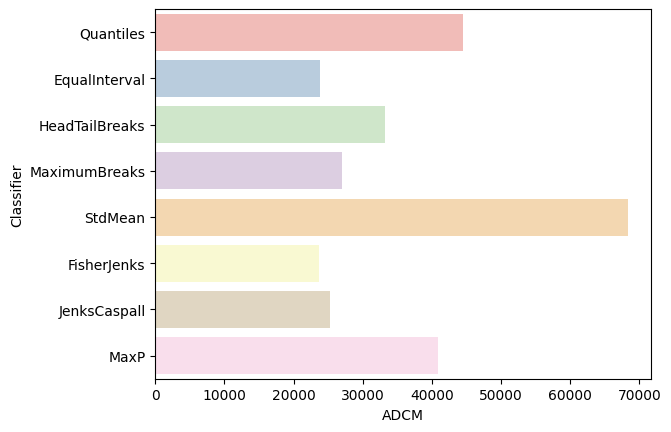

In [ ]:
class5 = q5, ei5, ht, mb5, msd, fj5, jc5, mp5

fits = np.array([c.adcm for c in class5])

adcms = pd.DataFrame(fits)

adcms["classifier"] = [c.name for c in class5]

adcms.columns = ["ADCM", "Classifier"]
ax = sns.barplot(
    y="Classifier", x="ADCM", data=adcms, palette="Pastel1"
)

In [ ]:
mx["Quantiles"] = q5.yb
mx["Equal Interval"] = ei5.yb
mx["Head-Tail Breaks"] = ht.yb
mx["Maximum Breaks"] = mb5.yb
mx["Mean-Standard Deviation"] = msd.yb
mx["Fisher-Jenks"] = fj5.yb
mx["Jenks Caspall"] = jc5.yb
mx["MaxP"] = mp5.yb

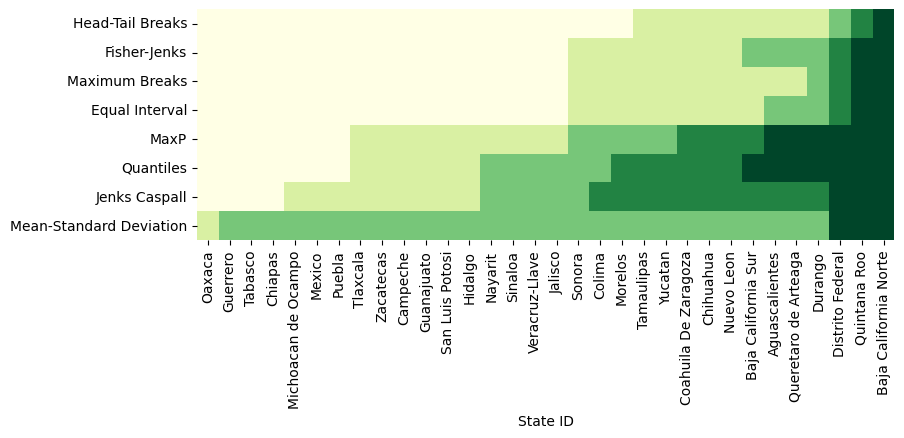

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 3))
sns.heatmap(
    mx.set_index("NAME")
    .sort_values("PCGDP1940")[
        [
            "Head-Tail Breaks",
            "Fisher-Jenks",
            "Maximum Breaks",
            "Equal Interval",
            "MaxP",
            "Quantiles",
            "Jenks Caspall",
            "Mean-Standard Deviation",
        ]
    ]
    .T,
    cmap="YlGn",
    cbar=False,
    ax=ax,
)
ax.set_xlabel("State ID");

Aquí se puede ver la asignación a los diferentes grupos

In [ ]:
pd.DataFrame(
    {c.name: c.counts for c in class5},
    index=["Class-{}".format(i) for i in range(5)],
)

,Quantiles,EqualInterval,HeadTailBreaks,MaximumBreaks,StdMean,FisherJenks,JenksCaspall,MaxP
Class-0,7,17,20,17,0,17,4,7
Class-1,6,9,9,11,1,8,9,10
Class-2,6,3,1,1,28,4,5,5
Class-3,6,1,1,1,0,1,11,4
Class-4,7,2,1,2,3,2,3,6


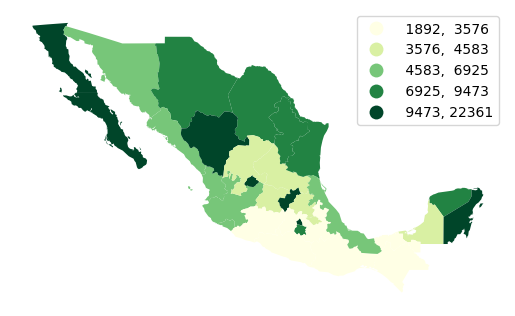

In [ ]:
ax = mx.plot(
    column="PCGDP1940",
    scheme="Quantiles",
    cmap="YlGn",
    legend=True,
    legend_kwds={"fmt": "{:.0f}"},
)
ax.set_axis_off();

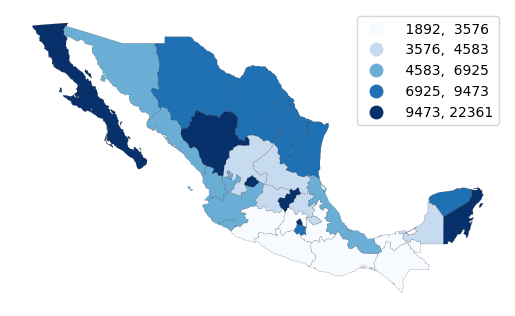

In [ ]:
ax = mx.plot(
    column="PCGDP1940",  # Data to plot
    scheme="Quantiles",  # Classification scheme
    cmap="Blues",  # Color palette
    edgecolor="k",  # Borderline color
    linewidth=0.1,  # Borderline width
    legend=True,  # Add legend
    legend_kwds={
        "fmt": "{:.0f}"
    },  # Remove decimals in legend (for legibility)
)
ax.set_axis_off()

In [ ]:
rnk = mx[["NAME", "PCGDP1940", "PCGDP2000"]].rank(ascending=False)
rnk["change"] = rnk["PCGDP1940"] - rnk["PCGDP2000"]
rnk["class"] = pd.cut(rnk["change"], [-np.inf, -5, 0, 5, 20])

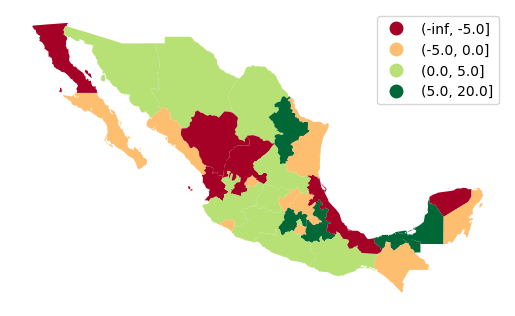

In [ ]:
ax = (
    mx[["geometry"]]
    .join(rnk)
    .plot("class", legend=True, cmap="RdYlGn")
)
ax.set_axis_off()

In [ ]:
mx["HANSON98"].head()

0    1.0
1    2.0
2    2.0
3    3.0
4    2.0
Name: HANSON98, dtype: float64

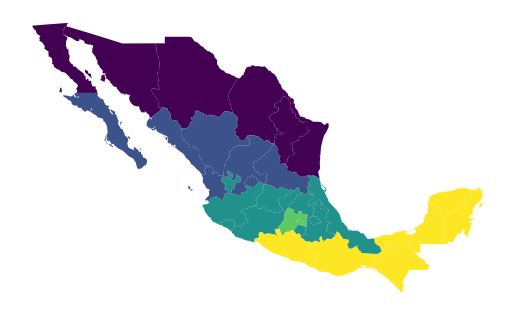

In [ ]:
ax = mx.plot("HANSON98")
ax.set_axis_off()

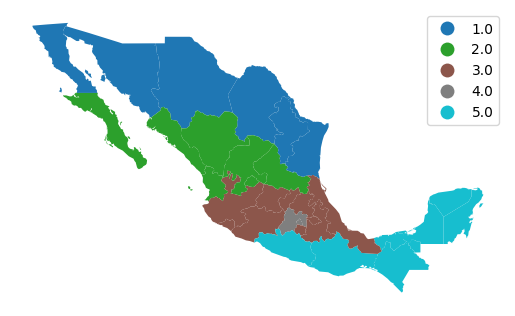

In [ ]:
ax = mx.plot("HANSON98", categorical=True, legend=True)
ax.set_axis_off()

In [ ]:
classi = mapclassify.UserDefined(
    mx["PCGDP2000"], [10000, 12500, 15000]
)
classi

UserDefined

      Interval         Count
----------------------------
[ 8684.00, 10000.00] |     2
(10000.00, 12500.00] |     7
(12500.00, 15000.00] |     1
(15000.00, 54349.00] |    22

(<Figure size 640x480 with 1 Axes>, <Axes: >)

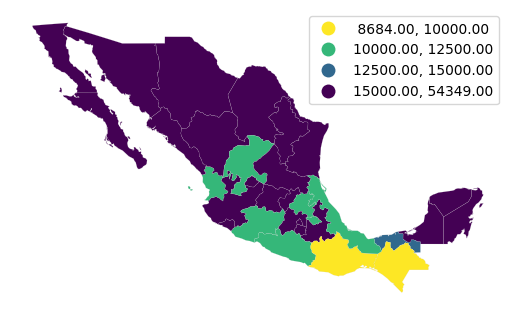

In [ ]:
classi.plot(
    mx,
    legend=True,
    legend_kwds={
        "loc": "upper right"
    },
    axis_on=False,
    cmap="viridis_r",
)

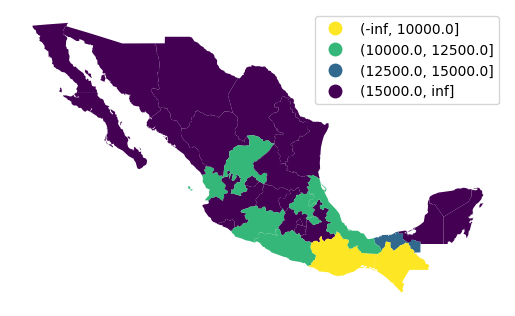

In [ ]:
lbls = pd.cut(
    mx["PCGDP2000"], [-np.inf, 10000, 12500, 15000, np.inf]
)

ax = mx.plot(lbls, cmap="viridis_r", legend=True)

ax.set_axis_off()

In [ ]:
years = ["PCGDP1940", "PCGDP1960", "PCGDP1980", "PCGDP2000"]
pooled = mapclassify.Pooled(mx[years], classifier="Quantiles", k=5)

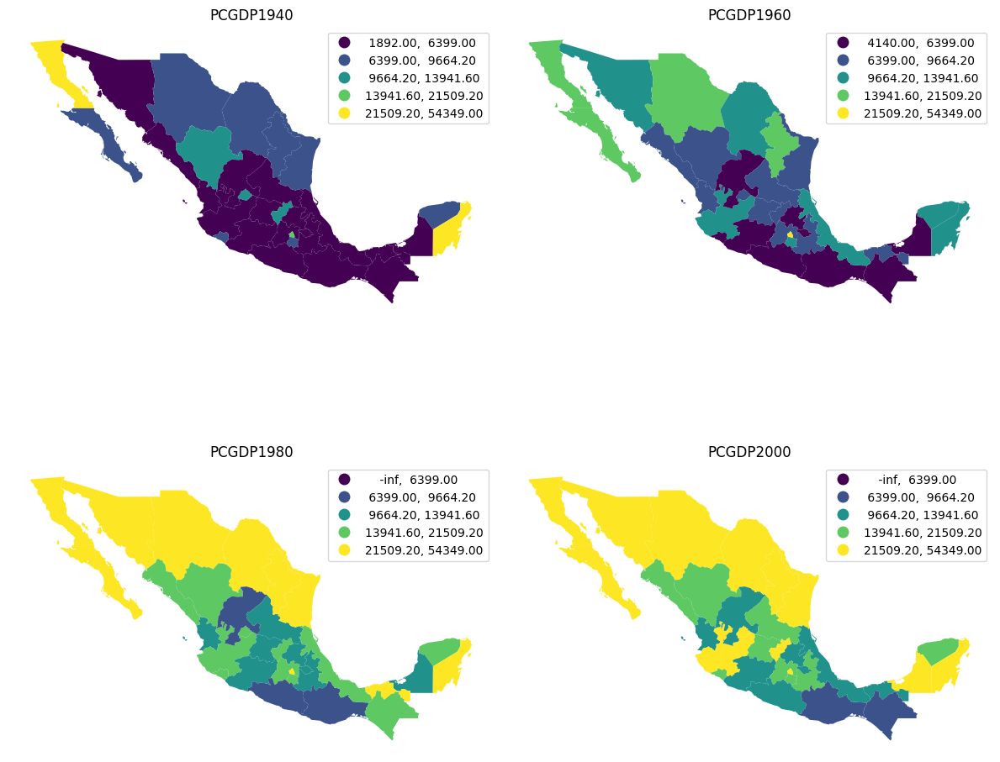

In [ ]:
f, axs = plt.subplots(2, 2, figsize=(12, 12))

axs = axs.flatten()

for i, y in enumerate(years):
    mx.plot(
        y,
        scheme="UserDefined",
        classification_kwds={
            "bins": pooled.global_classifier.bins
        },
        legend=True,
        ax=axs[i],
    )

    axs[i].set_axis_off()

    axs[i].set_title(y)

plt.tight_layout()

plt.show()

## Autocorrelación espacial global

La autocorrelación espacial tiene que ver con el grado en que la similitud entre los valores de las observaciones en un dataset están relacionadas con la similitud en la locación en tales observaciones.


In [ ]:
brexit_data_path = "https://raw.githubusercontent.com/gdsbook/book/master/data/brexit/brexit_vote.csv"
ref = pd.read_csv(brexit_data_path, index_col="Area_Code")
ref.info()

<class 'pandas.core.frame.DataFrame'>
Index: 382 entries, E06000031 to E08000036
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       382 non-null    int64  
 1   Region_Code              382 non-null    object 
 2   Region                   382 non-null    object 
 3   Area                     382 non-null    object 
 4   Electorate               382 non-null    int64  
 5   ExpectedBallots          382 non-null    int64  
 6   VerifiedBallotPapers     382 non-null    int64  
 7   Pct_Turnout              382 non-null    float64
 8   Votes_Cast               382 non-null    int64  
 9   Valid_Votes              382 non-null    int64  
 10  Remain                   382 non-null    int64  
 11  Leave                    382 non-null    int64  
 12  Rejected_Ballots         382 non-null    int64  
 13  No_official_mark         382 non-null    int64  
 14  Voting_for_both_a

In [ ]:
lads = gpd.read_file(
    "https://raw.githubusercontent.com/gdsbook/book/master/data/brexit/local_authority_districts.geojson"
).set_index("lad16cd")
lads.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 391 entries, E06000001 to W06000023
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   objectid    391 non-null    int64   
 1   lad16nm     391 non-null    object  
 2   lad16nmw    22 non-null     object  
 3   bng_e       391 non-null    int64   
 4   bng_n       391 non-null    int64   
 5   long        391 non-null    float64 
 6   lat         391 non-null    float64 
 7   st_areasha  391 non-null    float64 
 8   st_lengths  391 non-null    float64 
 9   geometry    391 non-null    geometry
dtypes: float64(4), geometry(1), int64(3), object(2)
memory usage: 41.7+ KB


In [ ]:
db = (
    gpd.GeoDataFrame(
        lads.join(ref[["Pct_Leave"]]), crs=lads.crs
    )
    .to_crs(epsg=3857)[
        ["objectid", "lad16nm", "Pct_Leave", "geometry"]
    ]
    .dropna()
)
db.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 380 entries, E06000001 to W06000023
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   objectid   380 non-null    int64   
 1   lad16nm    380 non-null    object  
 2   Pct_Leave  380 non-null    float64 
 3   geometry   380 non-null    geometry
dtypes: float64(1), geometry(1), int64(1), object(1)
memory usage: 22.9+ KB


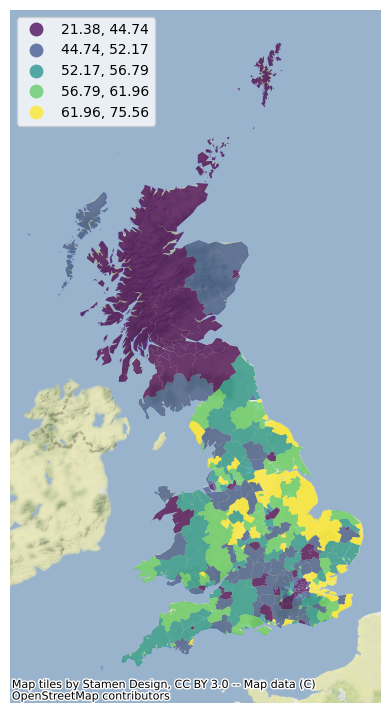

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
db.plot(
    column="Pct_Leave",
    cmap="viridis",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.0,
    alpha=0.75,
    legend=True,
    legend_kwds={"loc": 2},
    ax=ax,
)
contextily.add_basemap(
    ax,
    crs=db.crs,
    source=contextily.providers.Stamen.TerrainBackground,
)
ax.set_axis_off()

In [ ]:
# matriz de pesos
w = weights.KNN.from_dataframe(db, k=8)
w.transform = "R"

#### Operador de lag espacial

Es una de las aplicaciones más comunes de las matrices de pesos en el análisis espacial. La definición matemática es el producto de $W$ y el vector de una variable dada. Conceptualmente, el lag espacial captura el comportamiento de una variable en el espacio.

$$Y_{sl}=WY$$

$$y_{sl-i}=\sum_j w_{ij}y_j$$

In [ ]:
db["Pct_Leave_lag"] = weights.spatial_lag.lag_spatial(
    w, db["Pct_Leave"]
)

In [ ]:
db.loc[["E08000012", "S12000019"], ["Pct_Leave", "Pct_Leave_lag"]]

,Pct_Leave,Pct_Leave_lag
lad16cd,,
E08000012,41.81,54.61375
S12000019,37.94,38.01875


En este caso tenemos dos locaciones diferentes con dos votaciones similares. Sin embargo, tenemos una diferencia fuerte en el lag espacial mostrando así los contextos espaciales diferentes de ambas regiones.

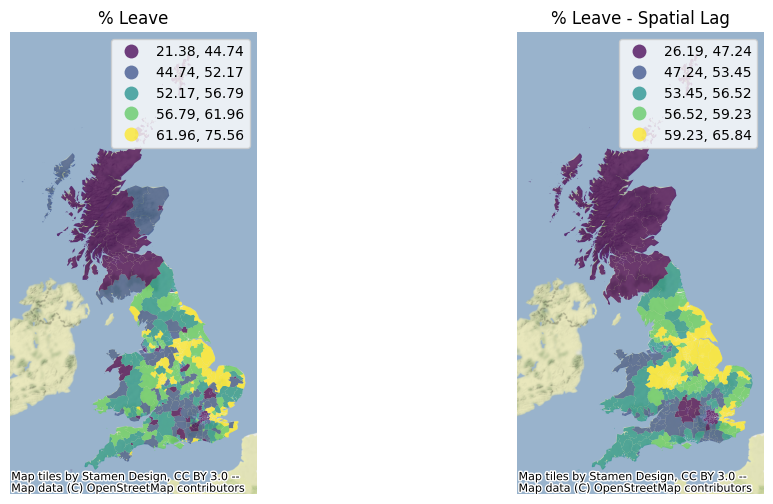

In [ ]:
f, axs = plt.subplots(1, 2, figsize=(12, 6))
ax1, ax2 = axs

db.plot(
    column="Pct_Leave",
    cmap="viridis",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.0,
    alpha=0.75,
    legend=True,
    ax=ax1,
)
ax1.set_axis_off()
ax1.set_title("% Leave")
contextily.add_basemap(
    ax1,
    crs=db.crs,
    source=contextily.providers.Stamen.TerrainBackground,
)

db.plot(
    column="Pct_Leave_lag",
    cmap="viridis",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.0,
    alpha=0.75,
    legend=True,
    ax=ax2,
)
ax2.set_axis_off()
ax2.set_title("% Leave - Spatial Lag")
contextily.add_basemap(
    ax2,
    crs=db.crs,
    source=contextily.providers.Stamen.TerrainBackground,
)

plt.show()

#### Caso binario

In [ ]:
db["Leave"] = (db["Pct_Leave"] > 50).astype(int)
db[["Pct_Leave", "Leave"]].tail()

,Pct_Leave,Leave
lad16cd,,
W06000018,57.63,1
W06000019,62.03,1
W06000021,49.56,0
W06000022,55.99,1
W06000023,53.74,1


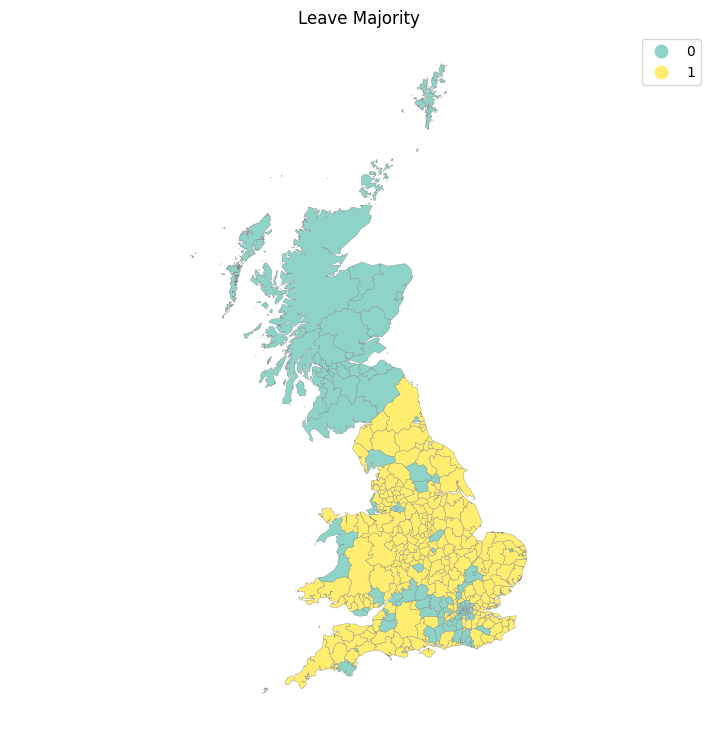

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
db.plot(
    ax=ax,
    column="Leave",
    categorical=True,
    legend=True,
    edgecolor="0.5",
    linewidth=0.25,
    cmap="Set3",
    figsize=(9, 9),
)
ax.set_axis_off()
ax.set_title("Leave Majority")
plt.axis("equal")
plt.show()

In [ ]:
w.transform

'R'

In [ ]:
w.transform = "O"

In [ ]:
w.transform

'O'

In [ ]:
seed(1234)
jc = esda.join_counts.Join_Counts(db["Leave"], w)
jc

In [ ]:
jc.bb

871.0

In [ ]:
jc.ww

302.0

In [ ]:
jc.bw

347.0

In [ ]:
jc.bb + jc.ww + jc.bw

1520.0

In [ ]:
jc.J

1520.0

In [ ]:
jc.mean_bb

727.4124124124124

In [ ]:
jc.mean_bw

649.3233233233233

In [ ]:
jc.p_sim_bb

In [ ]:
jc.p_sim_bw

1.0

#### Caso continuo: gráfico de Moran y la I de Moran



$$I=\frac{n}{\sum_i\sum_jw_{ij}}\frac{\sum_i\sum_jw_{ij}z_iz_j}{\sum_iz_i^2}$$

In [ ]:
db["Pct_Leave_std"] = db["Pct_Leave"] - db["Pct_Leave"].mean()
db["Pct_Leave_lag_std"] = weights.lag_spatial(
    w, db["Pct_Leave_std"]
)

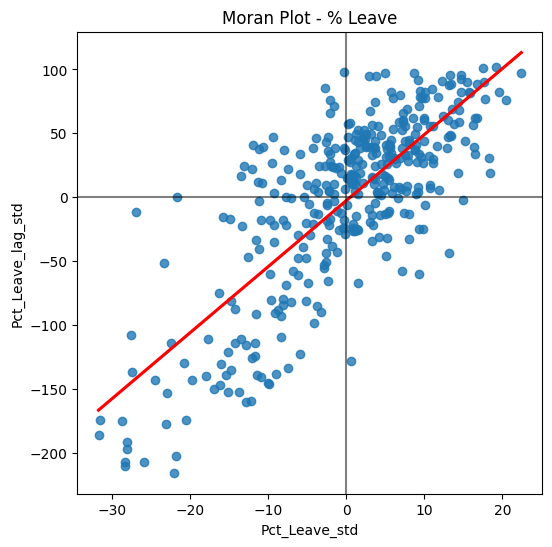

In [ ]:
f, ax = plt.subplots(1, figsize=(6, 6))
sns.regplot(
    x="Pct_Leave_std",
    y="Pct_Leave_lag_std",
    ci=None,
    data=db,
    line_kws={"color": "r"},
)
ax.axvline(0, c="k", alpha=0.5)
ax.axhline(0, c="k", alpha=0.5)
ax.set_title("Gráfico de Moran - % Leave")
plt.show()

El gráfico indica una autocorrelación espacial positiva: valores similares tienden a estar ubicados uno cerca al otro.

In [ ]:
w.transform = "R"
moran = esda.moran.Moran(db["Pct_Leave"], w)

In [ ]:
moran.I

0.6454521298096587

Esta es la pendiente de la línea del gráfico de Moran. Vamos a probar la significancia estadística con la hipótesis nula de que la organización del mapa es aleatoria.

In [ ]:
moran.p_sim

0.001

/usr/local/lib/python3.10/dist-packages/splot/_viz_esda_mpl.py:354: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sbn.kdeplot(moran.sim, shade=shade, color=color, ax=ax, **kwargs)


(<Figure size 1000x400 with 2 Axes>,
 array([<Axes: title={'center': 'Reference Distribution'}, xlabel='Moran I: 0.65', ylabel='Density'>,
        <Axes: title={'center': 'Moran Scatterplot (0.65)'}, xlabel='Attribute', ylabel='Spatial Lag'>],
       dtype=object))

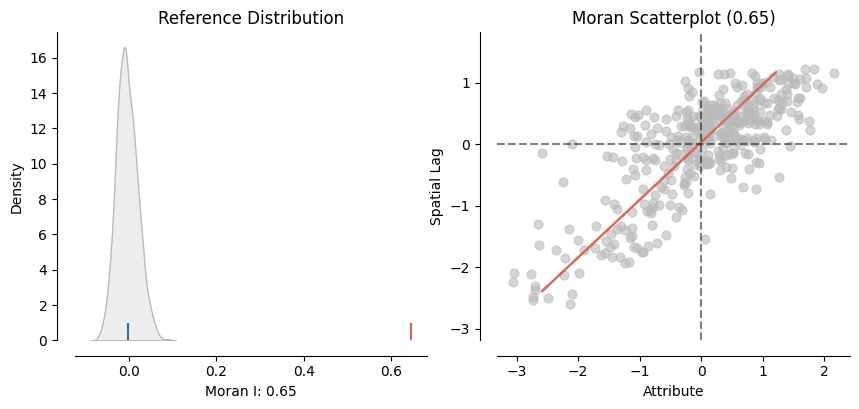

In [ ]:
plot_moran(moran)

## Correlación espacial local

Las medidas locales de autocorrelación espacial se concentra en las relaciones entre cada observación y las que la rodean, enl ugar de proveer una sola métrica de estas relaciones a lo largo del mapa. De esta forma, no son estadísticas agregadas sino métricas que permiten aprender más acerca de la estructura espacial de los datos.


In [ ]:
db = (
    gpd.GeoDataFrame(
        lads.join(ref[["Pct_Leave"]]), crs=lads.crs
    )
    .to_crs(epsg=3857)[
        ["objectid", "lad16nm", "Pct_Leave", "geometry"]
    ]
    .dropna()
)

db.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 380 entries, E06000001 to W06000023
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   objectid   380 non-null    int64   
 1   lad16nm    380 non-null    object  
 2   Pct_Leave  380 non-null    float64 
 3   geometry   380 non-null    geometry
dtypes: float64(1), geometry(1), int64(1), object(1)
memory usage: 22.9+ KB


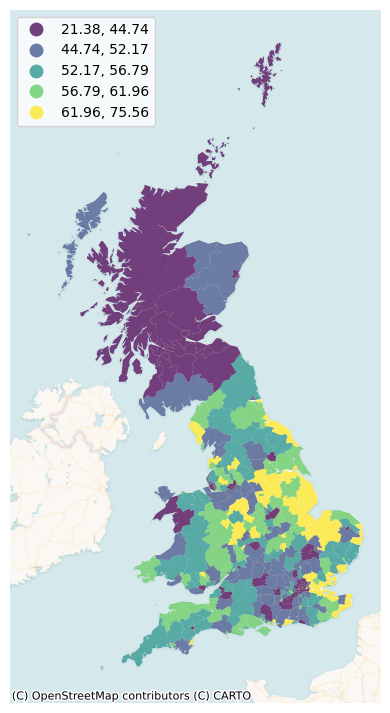

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

db.plot(
    column="Pct_Leave",
    cmap="viridis",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.0,
    alpha=0.75,
    legend=True,
    legend_kwds=dict(loc=2),
    ax=ax,
)

contextily.add_basemap(
    ax,
    crs=db.crs,
    source=contextily.providers.CartoDB.VoyagerNoLabels,
)

ax.set_axis_off()

In [ ]:
# matriz de pesos
w = weights.distance.KNN.from_dataframe(db, k=8)
# estandarización por filas
w.transform = "R"

In [ ]:
db["w_Pct_Leave"] = weights.lag_spatial(w, db['Pct_Leave'])

In [ ]:
db["Pct_Leave_std"] = db["Pct_Leave"] - db["Pct_Leave"].mean()
db["w_Pct_Leave_std"] = weights.lag_spatial(w, db['Pct_Leave_std'])

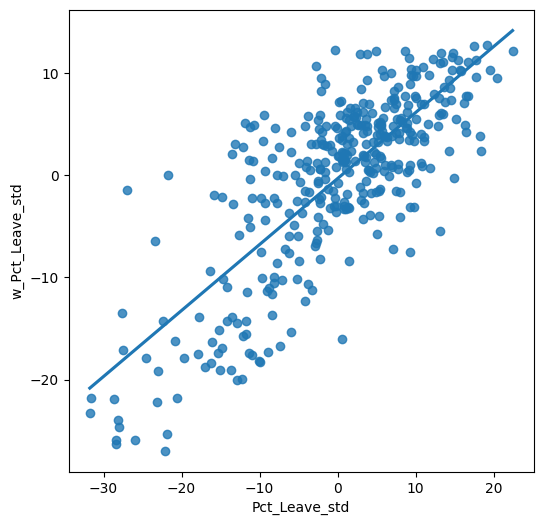

In [ ]:
f, ax = plt.subplots(1, figsize=(6, 6))

sns.regplot(
    x="Pct_Leave_std", y="w_Pct_Leave_std", data=db, ci=None
)
plt.show()

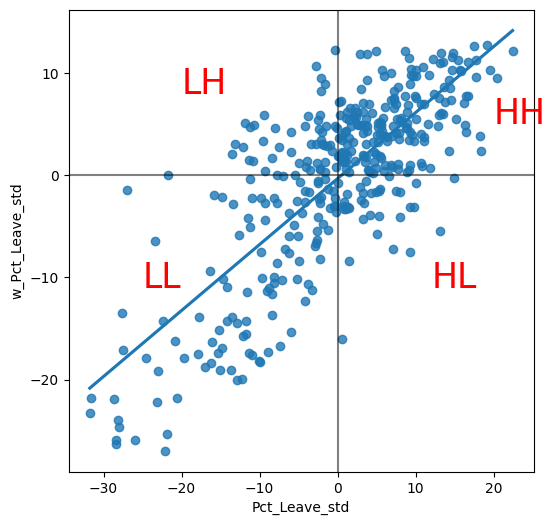

In [ ]:
f, ax = plt.subplots(1, figsize=(6, 6))

sns.regplot(
    x="Pct_Leave_std", y="w_Pct_Leave_std", data=db, ci=None
)

plt.axvline(0, c="k", alpha=0.5)
plt.axhline(0, c="k", alpha=0.5)

plt.text(20, 5, "HH", fontsize=25, c="r")
plt.text(12, -11, "HL", fontsize=25, c="r")
plt.text(-20, 8.0, "LH", fontsize=25, c="r")
plt.text(-25, -11.0, "LL", fontsize=25, c="r")

plt.show()

#### I de Moran local

El objetivo de esta métrica es identificar casos en los cuales el valor de una observación y el promedio de las observaciones alrededor is más parecido (HH o LL) o menos parecido (HL, LH) de lo que se esperaría por pura aleatoriedad.

$$I_i=\frac{z_i}{m_2}\sum_j w_{ij}z_j;\hspace{0.2cm}m_2=\frac{\sum_iz_i^2}{n}$$

In [ ]:
lisa = esda.moran.Moran_Local(db["Pct_Leave"], w)

<Axes: ylabel='Density'>

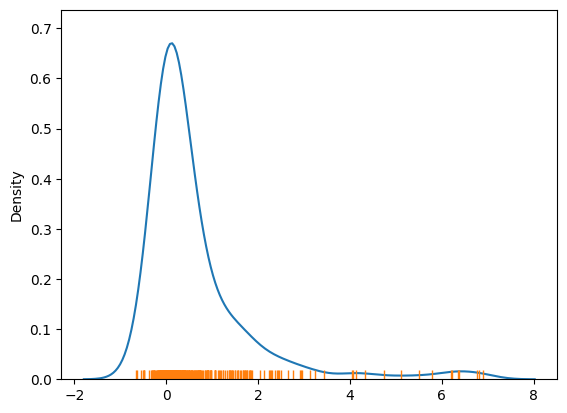

In [ ]:
ax = sns.kdeplot(lisa.Is)

sns.rugplot(lisa.Is, ax=ax)

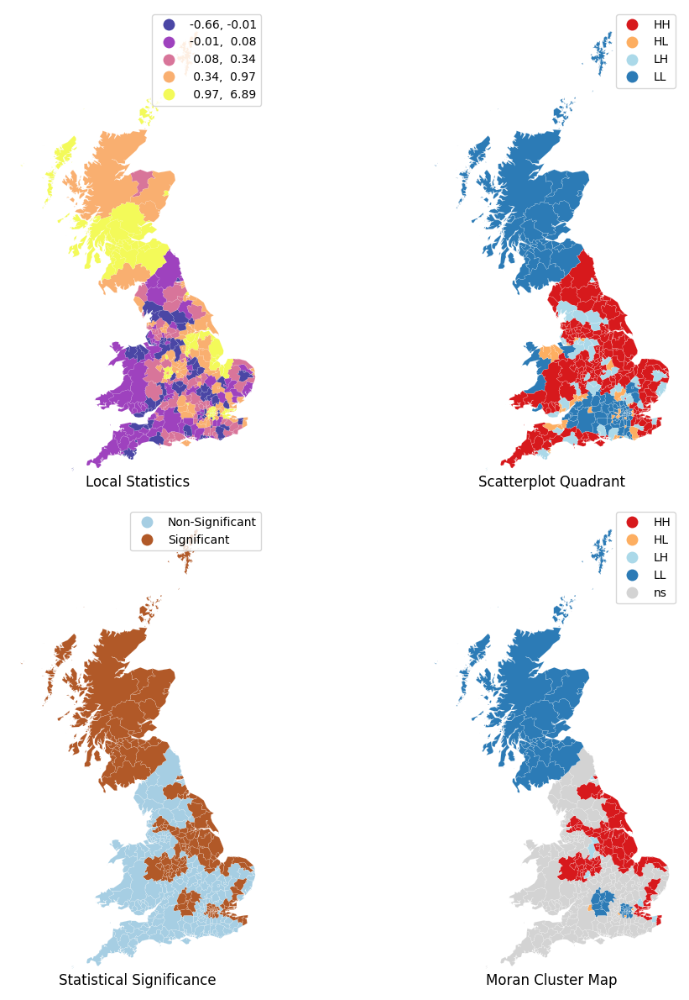

In [ ]:
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
axs = axs.flatten()

# Subplot 1
ax = axs[0]

db.assign(
    Is=lisa.Is

).plot(
    column="Is",
    cmap="plasma",
    scheme="quantiles",
    k=5,
    edgecolor="white",
    linewidth=0.1,
    alpha=0.75,
    legend=True,
    ax=ax,
)

# Subplot 2 #


ax = axs[1]

esdaplot.lisa_cluster(lisa, db, p=1, ax=ax)


ax = axs[2]

labels = pd.Series(
    1 * (lisa.p_sim < 0.05),
    index=db.index
).map({1: "Significant", 0: "Non-Significant"})

db.assign(
    cl=labels
).plot(
    column="cl",
    categorical=True,
    k=2,
    cmap="Paired",
    linewidth=0.1,
    edgecolor="white",
    legend=True,
    ax=ax,
)


# Subplot 4 #

ax = axs[3]

esdaplot.lisa_cluster(lisa, db, p=0.05, ax=ax)


for i, ax in enumerate(axs.flatten()):
    ax.set_axis_off()
    ax.set_title(
        [
            "Local Statistics",
            "Scatterplot Quadrant",
            "Statistical Significance",
            "Moran Cluster Map",
        ][i],
        y=0,
    )

f.tight_layout()

plt.show()

El gráfico en el cuadrante superior a la izquierda muestra los valores más grandes del estadístico local. El gráfico en el cuadrante superior a la derecha muestra a qué valor pertenece cada región en cuanto a cada uno de los cuadrantes. A la izquierda-abajo se puede ver cuando la autocorrelación es estadísticamente significativa.

In [ ]:
lisa.q[:10]

array([1, 1, 1, 1, 1, 1, 4, 1, 4, 1])

In [ ]:
counts = pd.value_counts(lisa.q)
counts

1    183
3    113
2     50
4     34
dtype: int64

In [ ]:
(lisa.p_sim < 0.05).sum() * 100 / len(lisa.p_sim)

43.94736842105263

In [ ]:
db["p-sim"] = lisa.p_sim

sig = 1 * (lisa.p_sim < 0.05)

db["sig"] = sig

db[["sig", "p-sim"]].head()

,sig,p-sim
lad16cd,,
E06000001,1,0.007
E06000002,1,0.008
E06000003,1,0.010
E06000004,1,0.009
E06000010,1,0.013


In [ ]:
db[["sig", "p-sim"]].tail()

,sig,p-sim
lad16cd,,
W06000018,0,0.471
W06000019,0,0.458
W06000021,0,0.451
W06000022,0,0.377
W06000023,0,0.245


In [ ]:
spots = lisa.q * sig

spots_labels = {
    0: "Non-Significant",
    1: "HH",
    2: "LH",
    3: "LL",
    4: "HL",
}

db["labels"] = pd.Series(

    spots,
    index=db.index

).map(spots_labels)

db["labels"].head()

lad16cd
E06000001    HH
E06000002    HH
E06000003    HH
E06000004    HH
E06000010    HH
Name: labels, dtype: object

In [ ]:
db["labels"].value_counts()

Non-Significant    213
HH                  85
LL                  70
LH                   8
HL                   4
Name: labels, dtype: int64

## Análisis de patrones de puntos

### Visualización

In [ ]:
db = pd.read_csv("https://raw.githubusercontent.com/gdsbook/book/master/data/tokyo/tokyo_clean.csv")
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   user_id               10000 non-null  object 
 1   longitude             10000 non-null  float64
 2   latitude              10000 non-null  float64
 3   date_taken            10000 non-null  object 
 4   photo/video_page_url  10000 non-null  object 
 5   x                     10000 non-null  float64
 6   y                     10000 non-null  float64
dtypes: float64(4), object(3)
memory usage: 547.0+ KB


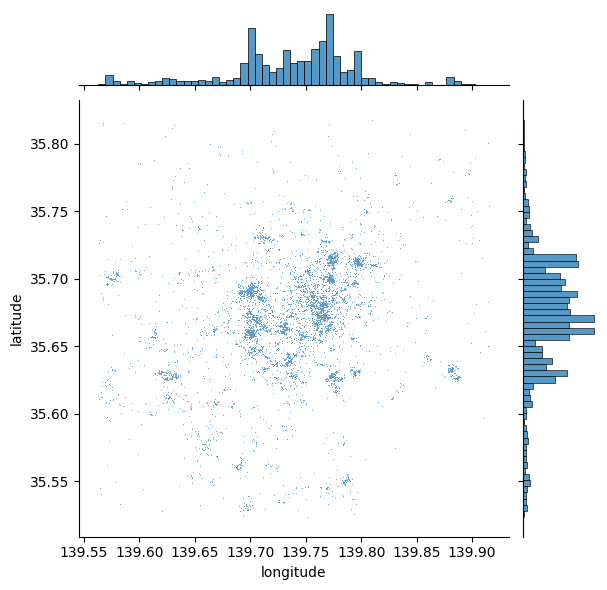

In [ ]:
# Generate scatter plot
sns.jointplot(x="longitude", y="latitude", data=db, s=0.5)

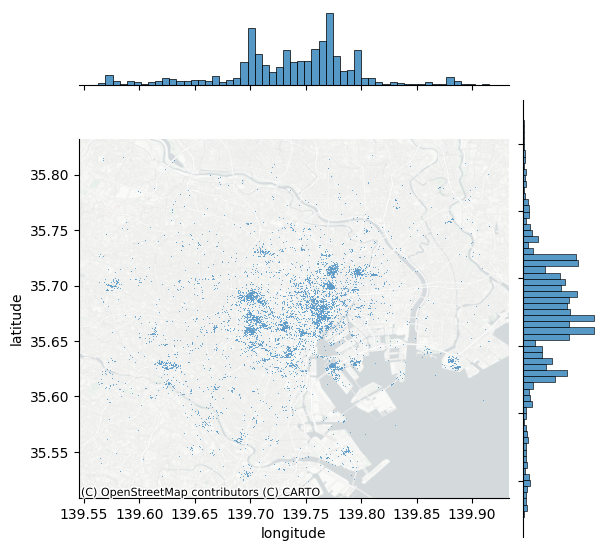

In [ ]:
# Generate scatter plot
joint_axes = sns.jointplot(
    x="longitude", y="latitude", data=db, s=0.5
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.PositronNoLabels,
)

#### Hexbinning

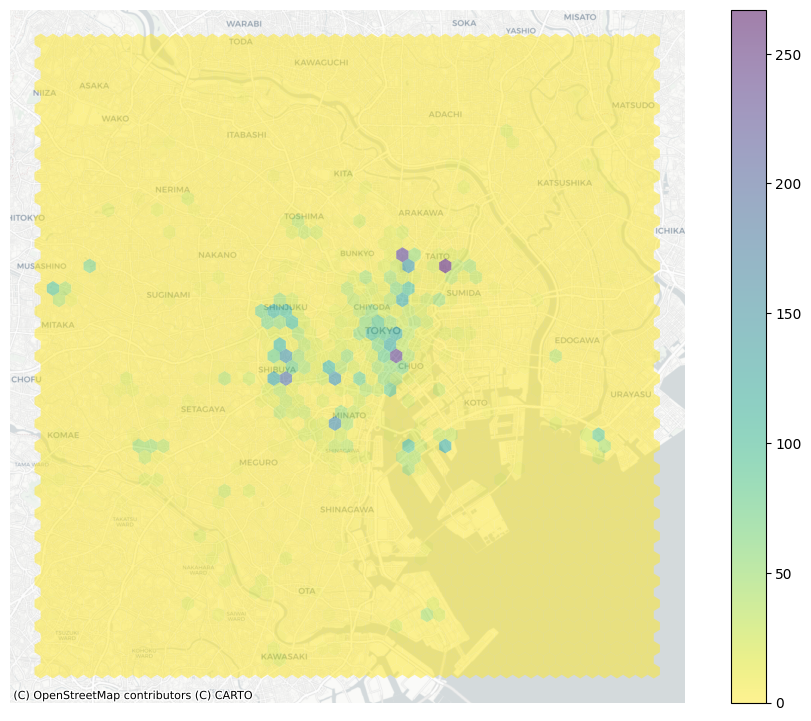

In [ ]:
f, ax = plt.subplots(1, figsize=(12, 9))

hb = ax.hexbin(
    db["x"],
    db["y"],
    gridsize=50,
    linewidths=0,
    alpha=0.5,
    cmap="viridis_r",
)

contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)

plt.colorbar(hb)

ax.set_axis_off()

#### Densidad

<ipython-input-254-9f4409d2c2a1>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(


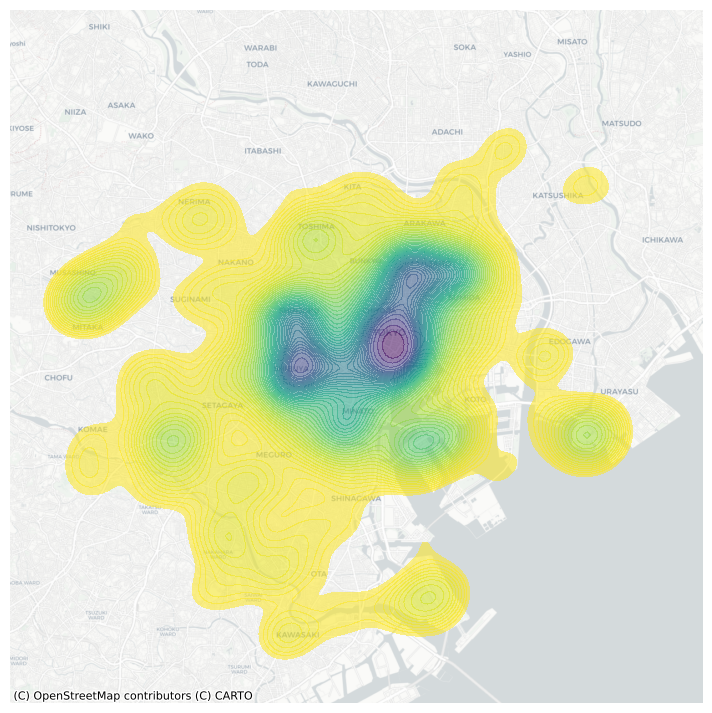

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

sns.kdeplot(
    x="x",
    y="y",
    data=db,
    n_levels=50,
    shade=True,
    alpha=0.55,
    cmap="viridis_r",
)

contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)

ax.set_axis_off()

### Centrografía

#### Tendencia

In [ ]:
mean_center = centrography.mean_center(db[["x", "y"]])
med_center = centrography.euclidean_median(db[["x", "y"]])

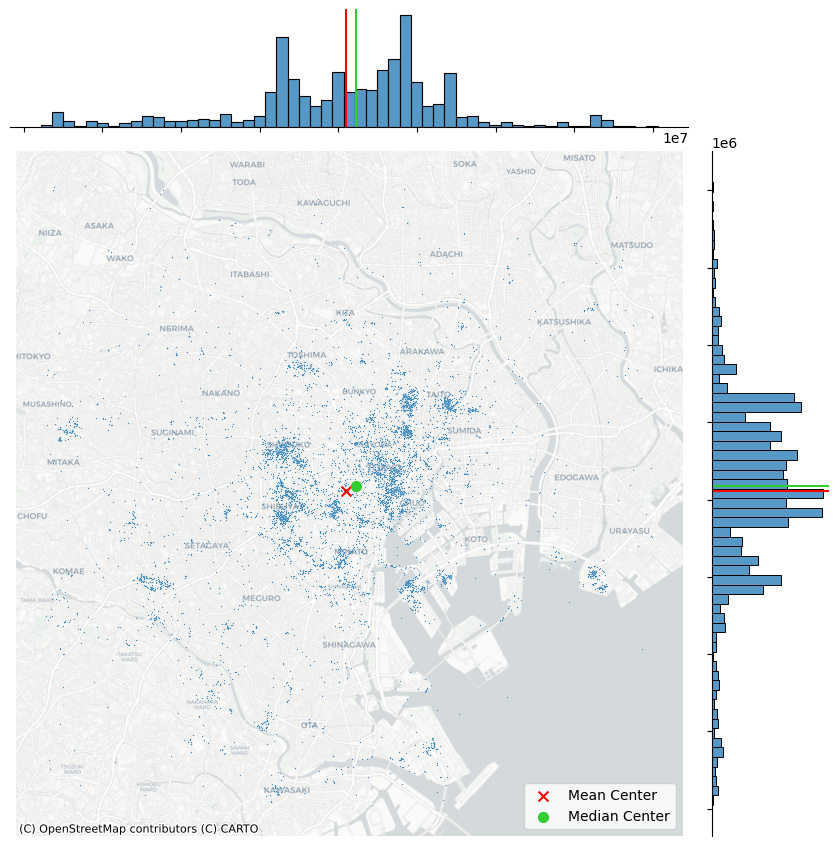

In [ ]:
joint_axes = sns.jointplot(
    x="x", y="y", data=db, s=0.75, height=9
)

joint_axes.ax_joint.scatter(
    *mean_center, color="red", marker="x", s=50, label="Mean Center"
)
joint_axes.ax_marg_x.axvline(mean_center[0], color="red")
joint_axes.ax_marg_y.axhline(mean_center[1], color="red")

joint_axes.ax_joint.scatter(
    *med_center,
    color="limegreen",
    marker="o",
    s=50,
    label="Median Center"
)
joint_axes.ax_marg_x.axvline(med_center[0], color="limegreen")
joint_axes.ax_marg_y.axhline(med_center[1], color="limegreen")

joint_axes.ax_joint.legend()

contextily.add_basemap(
    joint_axes.ax_joint, source=contextily.providers.CartoDB.Positron
)

joint_axes.ax_joint.set_axis_off()

plt.show()

#### Dispersión

In [ ]:
centrography.std_distance(db[["x", "y"]])

8778.218564382098

In [ ]:
major, minor, rotation = centrography.ellipse(db[["x", "y"]])

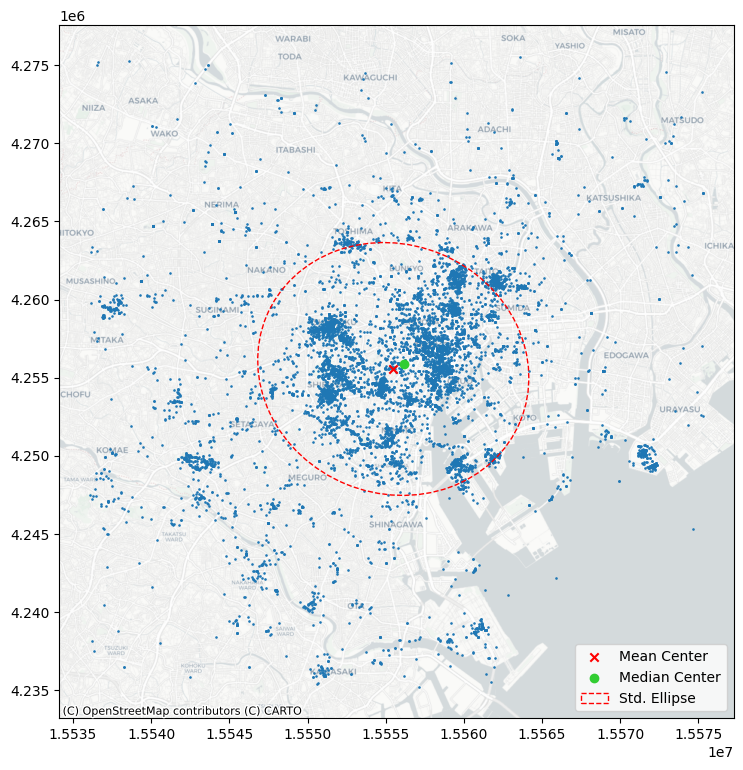

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

ax.scatter(db["x"], db["y"], s=0.75)
ax.scatter(*mean_center, color="red", marker="x", label="Mean Center")
ax.scatter(
    *med_center, color="limegreen", marker="o", label="Median Center"
)


ellipse = Ellipse(
    xy=mean_center,
    width=major * 2,
    height=minor * 2,
    angle=np.rad2deg(
        rotation
    ),
    facecolor="none",
    edgecolor="red",
    linestyle="--",
    label="Std. Ellipse",
)
ax.add_patch(ellipse)

ax.legend()

contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
plt.show()

#### Extent

In [ ]:
user = db.query('user_id == "95795770@N00"')
coordinates = user[["x", "y"]].values

In [ ]:
convex_hull_vertices = centrography.hull(coordinates)

In [ ]:
alpha_shape, alpha, circs = libpysal.cg.alpha_shape_auto(
    coordinates, return_circles=True
)

<ipython-input-266-cc73244b2b3b>:53: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


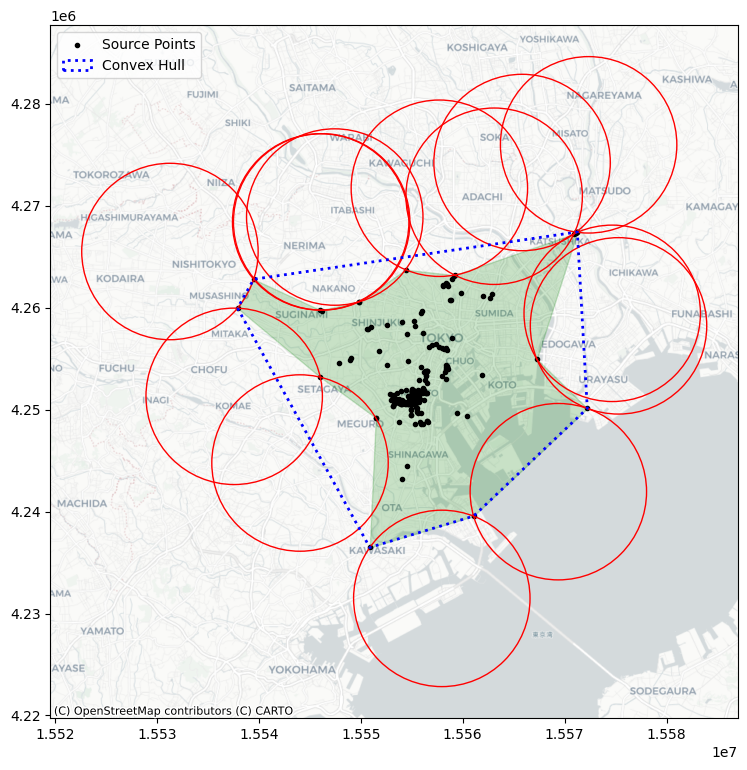

In [ ]:
f, ax = plt.subplots(1, 1, figsize=(9, 9))


geopandas.GeoSeries(
    [alpha_shape]
).plot(
    ax=ax,
    edgecolor="green",
    facecolor="green",
    alpha=0.2,
    label="Tightest single alpha shape",
)


ax.scatter(
    *coordinates.T, color="k", marker=".", label="Source Points"
)

for i, circle in enumerate(circs):

    if i == 0:
        label = "Bounding Circles"
    else:
        label = None
        ax.add_patch(
            plt.Circle(
                circle,
                radius=alpha,
                facecolor="none",
                edgecolor="r",
                label=label,
            )
        )


ax.add_patch(
    plt.Polygon(
        convex_hull_vertices,
        closed=True,
        edgecolor="blue",
        facecolor="none",
        linestyle=":",
        linewidth=2,
        label="Convex Hull",
    )
)


contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
plt.legend()

In [ ]:
point_array = geopandas.points_from_xy(x=user.x, y=user.y)

min_rot_rect = minimum_rotated_rectangle(
    from_shapely(
        point_array.unary_union()
    )
)
min_rot_rect = to_shapely(min_rot_rect)

/usr/local/lib/python3.10/dist-packages/pygeos/io.py:89: UserWarning: The shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the PyGEOS GEOS version (3.10.4-CAPI-1.16.2). Conversions between both will be slow
  warnings.warn(


In [ ]:
min_rect_vertices = centrography.minimum_bounding_rectangle(
    coordinates
)

In [ ]:
(center_x, center_y), radius = centrography.minimum_bounding_circle(
    coordinates
)

In [ ]:
convex_hull_patch = Polygon(
    convex_hull_vertices,
    closed=True,
    edgecolor="blue",
    facecolor="none",
    linestyle=":",
    linewidth=2,
    label="Convex Hull",
)


min_rect_width = min_rect_vertices[2] - min_rect_vertices[0]
min_rect_height = min_rect_vertices[2] - min_rect_vertices[0]


min_rect_patch = Rectangle(
    min_rect_vertices[0:2],
    width=min_rect_width,
    height=min_rect_height,
    edgecolor="goldenrod",
    facecolor="none",
    linestyle="dashed",
    linewidth=2,
    label="Min Bounding Rectangle",
)


circ_patch = Circle(
    (center_x, center_y),
    radius=radius,
    edgecolor="red",
    facecolor="none",
    linewidth=2,
    label="Min Bounding Circle",
)

<ipython-input-276-2d57a91c91a5>:32: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(ncol=1, loc="center left")


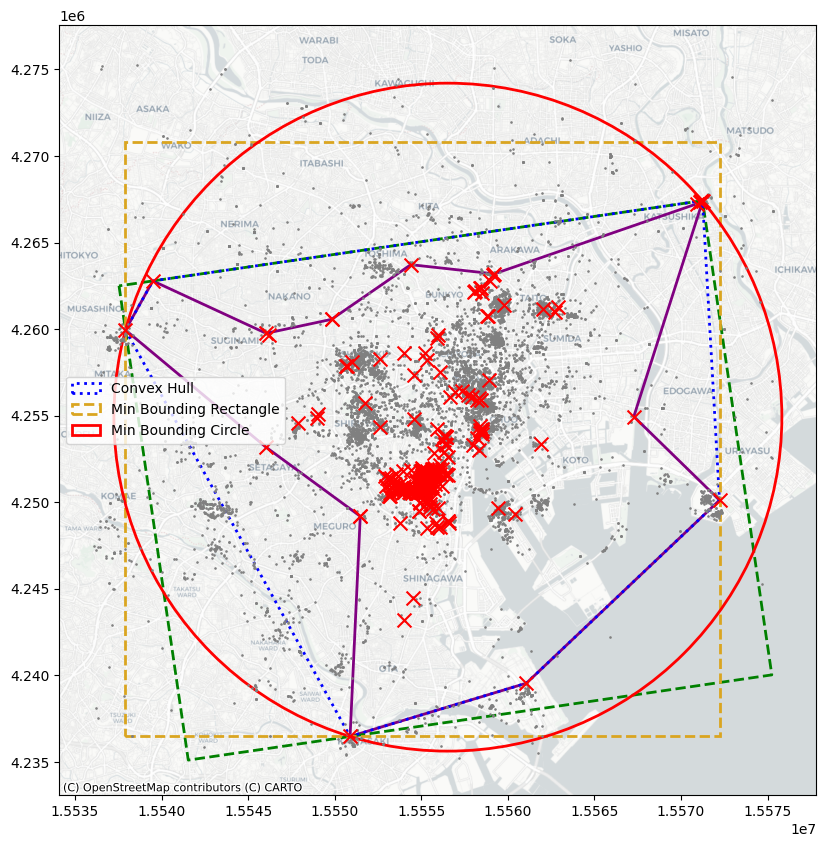

In [ ]:
f, ax = plt.subplots(1, figsize=(10, 10))


geopandas.GeoSeries(
    [alpha_shape]
).plot(
    ax=ax,
    edgecolor="purple",
    facecolor="none",
    linewidth=2,
    label="Alpha Shape",
)


geopandas.GeoSeries(
    [min_rot_rect]
).plot(
    ax=ax,
    edgecolor="green",
    facecolor="none",
    linestyle="--",
    label="Min Rotated Rectangle",
    linewidth=2,
)


ax.add_patch(convex_hull_patch)
ax.add_patch(min_rect_patch)
ax.add_patch(circ_patch)
ax.scatter(db.x, db.y, s=0.75, color="grey")
ax.scatter(user.x, user.y, s=100, color="r", marker="x")
ax.legend(ncol=1, loc="center left")


contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
plt.show()

## Aleatoriedad

In [ ]:
random_pattern = random.poisson(coordinates, size=len(coordinates))

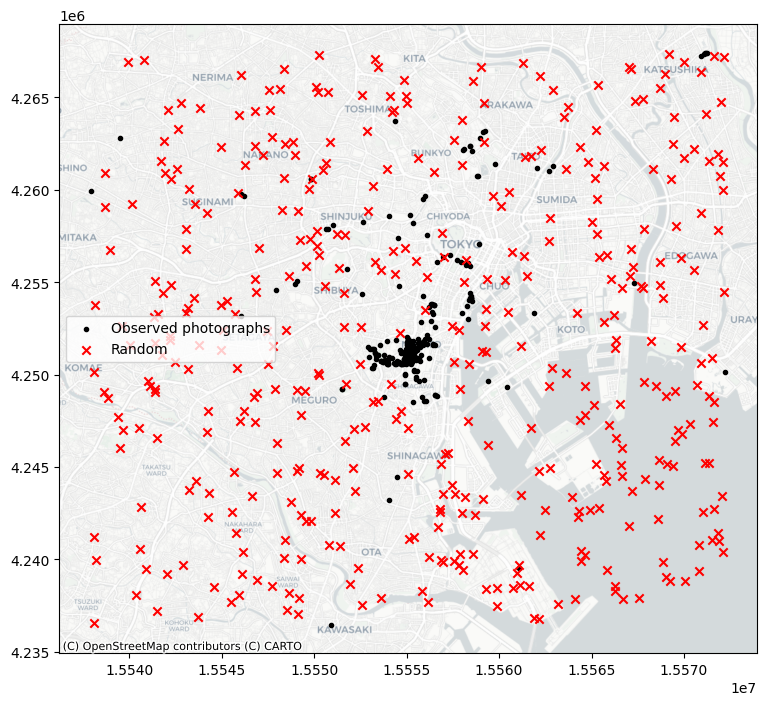

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(
    *coordinates.T,
    color="k",
    marker=".",
    label="Observed photographs"
)
plt.scatter(*random_pattern.T, color="r", marker="x", label="Random")
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc="center left")
plt.show()

In [ ]:
random_pattern_ashape = random.poisson(
    alpha_shape, size=len(coordinates)
)

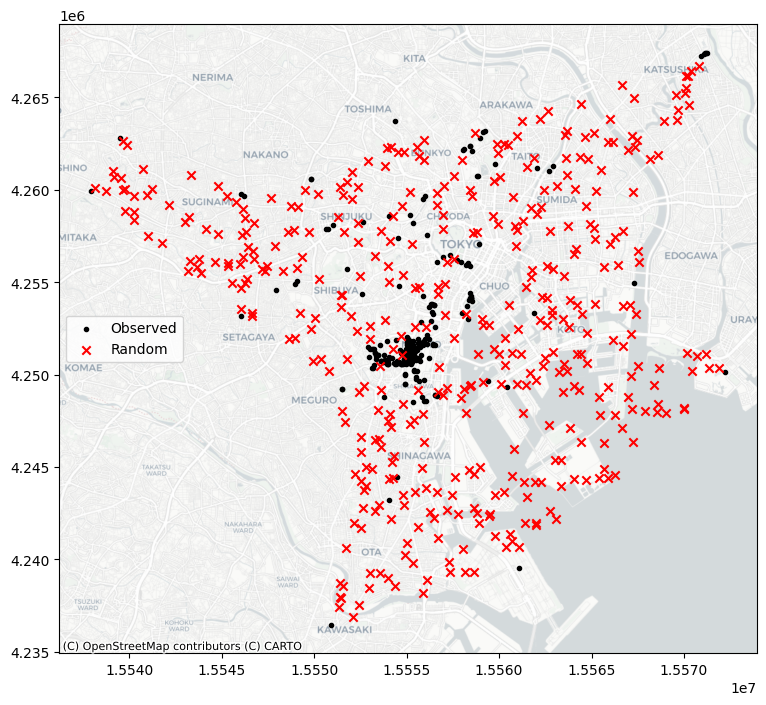

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
plt.scatter(*coordinates.T, color="k", marker=".", label="Observed")
plt.scatter(
    *random_pattern_ashape.T, color="r", marker="x", label="Random"
)
contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)
ax.legend(ncol=1, loc="center left")
plt.show()

### Quadrat statistics

/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


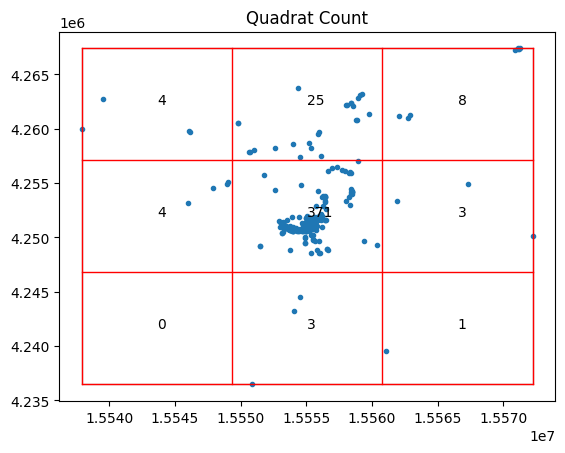

In [ ]:
qstat = QStatistic(coordinates)
qstat.plot()

In [ ]:
qstat.chi2_pvalue

0.0

/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


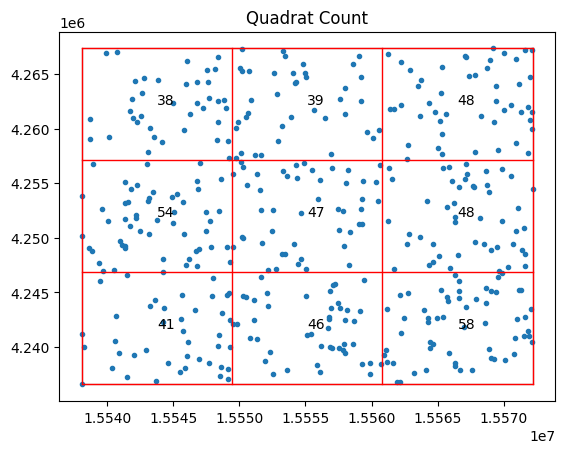

In [ ]:
qstat_null = QStatistic(random_pattern)
qstat_null.plot()

In [ ]:
qstat_null.chi2_pvalue

0.47700677004656966

/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


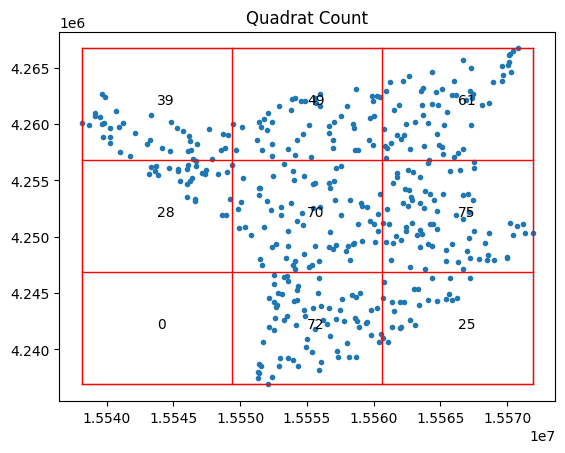

In [ ]:
qstat_null_ashape = QStatistic(random_pattern_ashape)
qstat_null_ashape.plot()

In [ ]:
qstat_null_ashape.chi2_pvalue

9.830916810295379e-21

### Funciones de Ripley

#### Función G

Distribución de la distancia de los puntos.

/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1492: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)
/usr/local/lib/python3.10/dist-packages/libpysal/cg/shapes.py:1208: FutureWarning: Objects based on the `Geometry` class will deprecated and removed in a future version of libpysal.
  warnings.warn(dep_msg, FutureWarning)


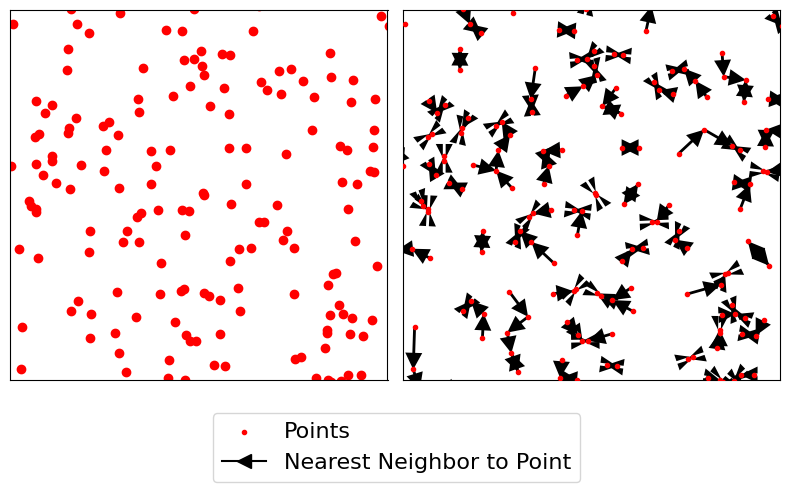

In [ ]:
f, ax = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
ax[0].scatter(*random_pattern.T, color="red")
ax[1].scatter(
    *random_pattern.T,
    color="red",
    zorder=100,
    marker=".",
    label="Points"
)
nn_ixs, nn_ds = PointPattern(random_pattern).knn(1)
first = True
for coord, nn_ix, nn_d in zip(random_pattern, nn_ixs, nn_ds):
    dx, dy = random_pattern[nn_ix].squeeze() - coord
    arrow = ax[1].arrow(
        *coord,
        dx,
        dy,
        length_includes_head=True,
        overhang=0,
        head_length=300 * 3,
        head_width=300 * 3,
        width=50 * 3,
        linewidth=0,
        facecolor="k",
        head_starts_at_zero=False
    )
    if first:
        plt.plot(
            (1e100, 1e101),
            (0, 1),
            color="k",
            marker="<",
            markersize=10,
            label="Nearest Neighbor to Point",
        )
    first = False

ax[0].axis([1.554e7, 1.556e7, 4240000, 4260000])
ax[0].set_xticklabels([])
ax[0].set_yticklabels([])
ax[0].set_xticks([])
ax[0].set_yticks([])
f.tight_layout()
ax[1].legend(bbox_to_anchor=(0.5, -0.06), fontsize=16)
plt.show()

In [ ]:
g_test = distance_statistics.g_test(
    coordinates, support=40, keep_simulations=True
)

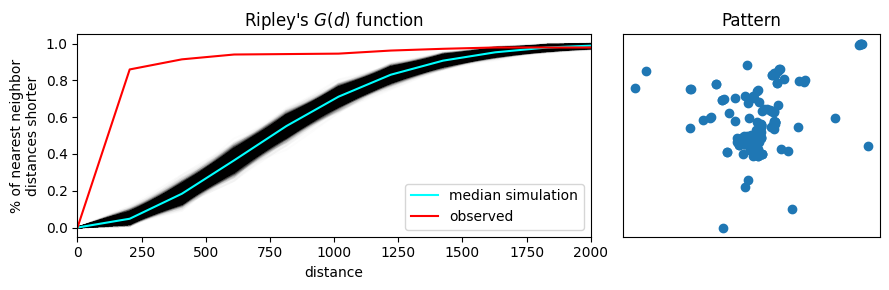

In [ ]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)

ax[0].plot(
    g_test.support, g_test.simulations.T, color="k", alpha=0.01
)

ax[0].plot(
    g_test.support,
    np.median(g_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)



ax[0].plot(
    g_test.support, g_test.statistic, label="observed", color="red"
)


ax[0].set_xlabel("distance")
ax[0].set_ylabel("% of nearest neighbor\ndistances shorter")
ax[0].legend()
ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $G(d)$ function")


ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

#### Función F

A diferencia de la función G, este evalúa la distancia a los puntos. Entre más espacios existan en los datos, más lento crece.

In [ ]:
f_test = distance_statistics.f_test(
    coordinates, support=40, keep_simulations=True
)

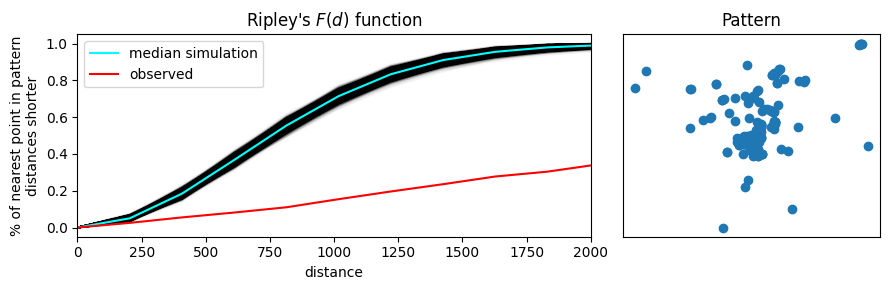

In [ ]:
f, ax = plt.subplots(
    1, 2, figsize=(9, 3), gridspec_kw=dict(width_ratios=(6, 3))
)


ax[0].plot(
    f_test.support, f_test.simulations.T, color="k", alpha=0.01
)

ax[0].plot(
    f_test.support,
    np.median(f_test.simulations, axis=0),
    color="cyan",
    label="median simulation",
)


ax[0].plot(
    f_test.support, f_test.statistic, label="observed", color="red"
)

ax[0].set_xlabel("distance")
ax[0].set_ylabel("% of nearest point in pattern\ndistances shorter")
ax[0].legend()
ax[0].set_xlim(0, 2000)
ax[0].set_title(r"Ripley's $F(d)$ function")

ax[1].scatter(*coordinates.T)

ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title("Pattern")
f.tight_layout()
plt.show()

### Clústers

![img](https://www.researchgate.net/publication/342141592/figure/fig4/AS:901775972380681@1592011554293/An-Example-Illustrating-the-Density-Based-DBSCAN-Clustering-Method-Applied-to-SMLM-Data.png)

In [ ]:
clusterer = DBSCAN()
clusterer.fit(db[["x", "y"]])

DBSCAN()

In [ ]:
clusterer.core_sample_indices_[:5]

array([ 1, 22, 30, 36, 42])

In [ ]:
clusterer.labels_[:5]

array([-1,  0, -1, -1, -1])

In [ ]:
lbls = pd.Series(clusterer.labels_, index=db.index)

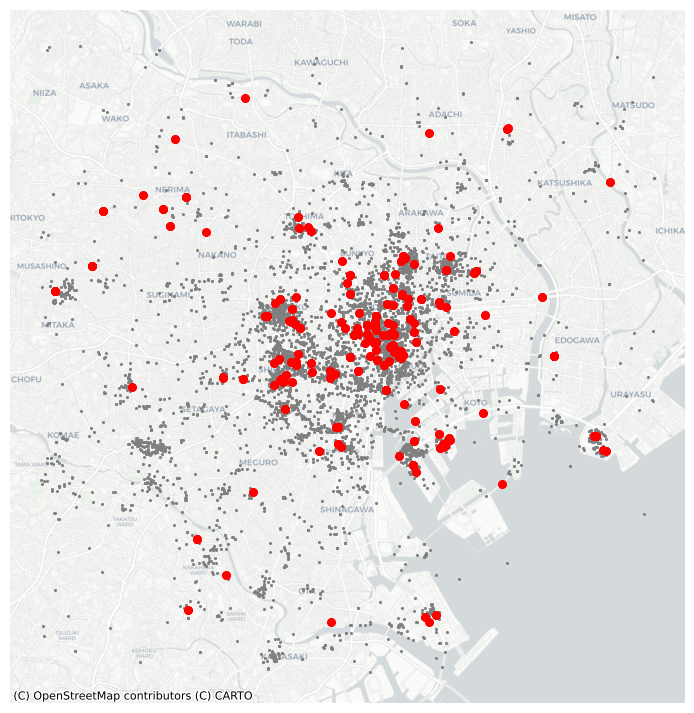

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
noise = db.loc[lbls == -1, ["x", "y"]]
ax.scatter(noise["x"], noise["y"], c="grey", s=5, linewidth=0)

ax.scatter(
    db.loc[db.index.difference(noise.index), "x"],
    db.loc[db.index.difference(noise.index), "y"],
    c="red",
    linewidth=0,
)

contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)

ax.set_axis_off()

plt.show()

In [ ]:
minp = np.round(db.shape[0] * 0.01)
minp

100.0

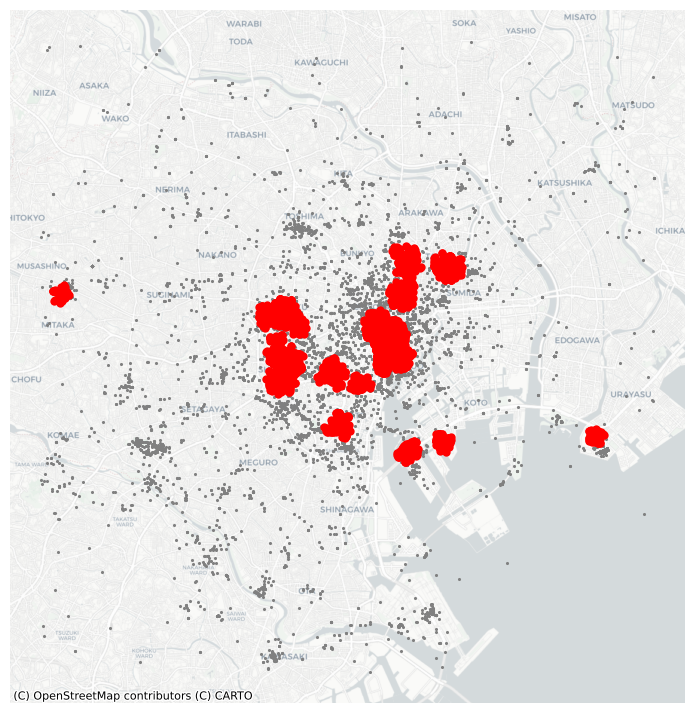

In [ ]:
clusterer = DBSCAN(eps=500, min_samples=int(minp))
clusterer.fit(db[["x", "y"]])

lbls = pd.Series(clusterer.labels_, index=db.index)

f, ax = plt.subplots(1, figsize=(9, 9))

noise = db.loc[lbls == -1, ["x", "y"]]

ax.scatter(noise["x"], noise["y"], c="grey", s=5, linewidth=0)

ax.scatter(
    db.loc[db.index.difference(noise.index), "x"],
    db.loc[db.index.difference(noise.index), "y"],
    c="red",
    linewidth=0,
)

contextily.add_basemap(
    ax, source=contextily.providers.CartoDB.Positron
)

ax.set_axis_off()

plt.show()

Tomado del libro Geographic Data Science (2023) con fines estrictamente educativos.